## Object Detection

### Install necessary packages

In [1]:
!pip install -q 'git+https://github.com/facebookresearch/detectron2.git'
!pip install -q ultralytics

  Preparing metadata (setup.py) ... done


### Unzip the downloaded datasets for the assignment

This creates the `aiHub.v1i.coco` and `aiHub.v1i.yolov8` folders in the current directory.

We use the `aiHub.v1i.yolov8` folder as the dataset for Part 2 when using YOLO V8.

We use the `aiHub.v1i.coco` folder as the dataset for Part 2 when using Detectron2.

In [2]:
!unzip -q -n aiHub.v1i.coco.zip -d aiHub.v1i.coco
!unzip -q -n aiHub.v1i.yolov8.zip -d aiHub.v1i.yolov8

### Import all the required packages

In [3]:
from torchvision.models.detection import fasterrcnn_resnet50_fpn_v2, FasterRCNN_ResNet50_FPN_V2_Weights
from detectron2.data import MetadataCatalog, build_detection_test_loader
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.engine import DefaultTrainer, DefaultPredictor
from detectron2.data.datasets import register_coco_instances
from detectron2.utils.visualizer import Visualizer
from detectron2.data.catalog import DatasetCatalog
from detectron2.utils.logger import setup_logger
from detectron2.config import get_cfg
from collections import defaultdict
from detectron2 import model_zoo
from ultralytics import YOLO
from copy import deepcopy
from pathlib import Path
from PIL import Image

import matplotlib.pyplot as plt
import numpy as np
import detectron2
import random
import torch
import glob
import cv2
import os

%matplotlib inline
_ = setup_logger()

### Common settings for the entire notebook

In [4]:
# determine hardware accelerator for the notebook
def get_optimal_device():
    if torch.cuda.is_available():
        return torch.device("cuda")
    elif torch.backends.mps.is_available():
        return torch.device("mps")
    else:
        return torch.device("cpu")

In [5]:
DEVICE = get_optimal_device()

In [6]:
print(f"hardware accelerator - {DEVICE.type}")

hardware accelerator - cuda


In [7]:
# https://stackoverflow.com/a/76898486
# Warm-up the GPU to speed up training
for _ in range(100):
    torch.matmul(torch.rand(500, 500).to(DEVICE), torch.rand(500, 500).to(DEVICE))
if DEVICE.type == "cuda":
    os.environ["CUBLAS_WORKSPACE_CONFIG"]=":4096:8"

In [8]:
# this function helps in selecting a unique color for each
# bounding box in an image or video depending on the class
# predicted for that bounding box.
def choose_colors(class_names):
    # use the tab20 color space from matplotlib
    cmap = plt.get_cmap("tab20")
    # assign a color for each class
    colors = {x: cmap(x % 20) for x in class_names.keys()}
    # convert the color to RGB
    rgb_colors = {
        num: (int(color[0] * 255), int(color[1] * 255), int(color[2] * 255))
        for num, color in colors.items()
    }
    return rgb_colors

In [9]:
# given a image (from a photo or a frame from a video), bounding boxes,
# class prediction for each bounding box, confidence in the class prediction
# for each box, name of each class and the color corresponding to each class,
# this function draws bounding boxes on all the detected objects in frame.
def draw_bounding_box(frame, bboxs, clsss, confs, class_names, class_colors):
    for bbox, clss, conf in zip(bboxs, clsss, confs):
        x1, y1, x2, y2 = bbox
        color = class_colors[clss]
        # Draw the bounding box
        cv2.rectangle(frame, (x1, y1), (x2, y2), color, 2)
        # Prepare the label text with probability
        label_text = f"{class_names[clss]}: {conf:.4f}"
        # Get the size of the text for positioning
        (text_width, text_height), _ = cv2.getTextSize(label_text, cv2.FONT_HERSHEY_SIMPLEX, 0.5, 1)
        # Draw a filled rectangle for the label background using the class color
        cv2.rectangle(frame, (x1, y1 - text_height - 5), (x1 + text_width, y1), color, -1)
        # Put the label text
        cv2.putText(frame, label_text, (x1, y1 - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255 ), 1)
    return frame

In [10]:
# given a list of frames, the function writes a 30 fps video
# to the filename specified
def create_video_from_images(frames, filename):
    # get the size of video using the size of first frame
    size = (frames[0].shape[1], frames[0].shape[0])
    # create the OpenCV videowriter object to create the video from a list of frames
    # use a frame rate of 30 fps
    fourcc = cv2.VideoWriter_fourcc(*'mp4v')
    out = cv2.VideoWriter(filename, fourcc, 30, size)
    # write each frame to the writer
    for frame in frames:
        # convert the image to BGR format
        frame = cv2.cvtColor(frame, cv2.COLOR_RGB2BGR)
        out.write(frame)
    out.release()

## Part 1 - Using torch pretrained models (Faster RCNN ResNet50 FPN V2)

In [11]:
MODEL_NAME = "fasterrcnn"
SOURCE_VIDEO = "video.mov"
TARGET_VIDEO = f"output_{MODEL_NAME}.mp4"

In [12]:
# create the faster R-CNN model
weights = FasterRCNN_ResNet50_FPN_V2_Weights.DEFAULT
model = fasterrcnn_resnet50_fpn_v2(weights=weights, box_score_thresh=0.9)
model = model.to(DEVICE)
model.eval()
preprocess = weights.transforms()

In [13]:
# create video capture object
cap = cv2.VideoCapture(SOURCE_VIDEO)

In [14]:
# save the predictions and frames to a list
frames = []
boxes = []
preds = []
clses = []

In [15]:
# capture the frames
while True:
    # read a frame in BGR format
    ret, frame = cap.read()
    if not ret:
        break
    # convert to RGB format
    frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    # append the frame to a list
    frames.append(frame)
    # make predictions on the frame
    frame = Image.fromarray(frame)
    batch = [preprocess(frame).to(DEVICE)]
    result = model(batch)[0]
    # get bounding boxes
    boxes.append(np.array(result["boxes"].detach().cpu(), dtype="int"))
    # get the confidence of class for each box
    preds.append(np.array(result["scores"].detach().cpu()))
    # get the class predictions
    clses.append(np.array(result["labels"].detach().cpu(), dtype="int"))

cap.release()

In [16]:
print(f"Total number of frames in the video - {len(frames)}")

Total number of frames in the video - 251


In [17]:
# list to store the annotated/labelled frames
new_frames = []
# number of frames
total_frames = len(frames)
# id and name of each class that can be identified by the model
class_names = {idx: x for idx, x in enumerate(weights.meta["categories"])}
# assign colors to each class
class_colors = choose_colors(class_names)
# draw bounding boxes on each frame, and store the new frame in `new_frames`
for _ in range(total_frames):
    frame = frames.pop(0)
    bboxs = boxes.pop(0)
    clsss = clses.pop(0)
    confs = preds.pop(0)
    new_frame = draw_bounding_box(frame, bboxs, clsss, confs, class_names, class_colors)
    new_frames.append(new_frame)
# convert the list of new frames to a video
create_video_from_images(new_frames, TARGET_VIDEO)

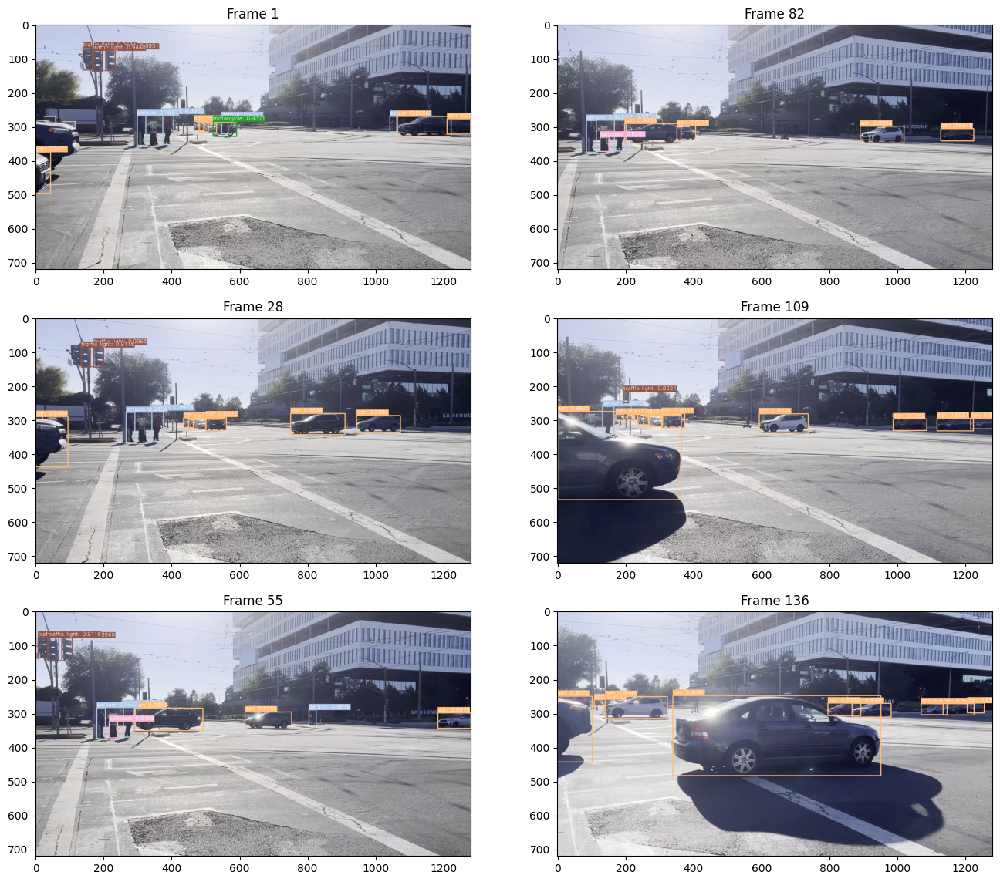

In [18]:
# sample frames from the converted video
fig, ax = plt.subplots(3, 2, figsize=(16,14))
for i in range(6):
    _ = ax[i % 3][i // 3].imshow(new_frames[27*i], vmin=0, vmax=255)
    _ = ax[i % 3][i // 3].set_title(f"Frame {27*i + 1}")

## Part 1 - Using Yolo V8

In [19]:
MODEL_NAME = "yolov8n"
SOURCE_VIDEO = "video.mov"
TARGET_VIDEO = f"output_{MODEL_NAME}.mp4"

In [20]:
# create the Yolo V8 model
model = YOLO(model=f"{MODEL_NAME}.pt", task="detect", verbose=False)

100%|██████████| 6.25M/6.25M [00:00<00:00, 132MB/s]


In [21]:
# create video capture object
cap = cv2.VideoCapture(SOURCE_VIDEO)

In [22]:
# save the predictions and frames to a list
frames = []
boxes = []
preds = []
clses = []

In [23]:
# capture the frames
while True:
    # read a frame in BGR format
    ret, frame = cap.read()
    if not ret:
        break
    # convert to RGB format
    frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    # append the frame to a list
    frames.append(frame)
    # make predictions on the frame
    result = model(frame)[0]
    # get bounding boxes
    boxes.append(np.array(result.boxes.xyxy.cpu(), dtype="int"))
    # get the confidence of class for each box
    preds.append(np.array(result.boxes.conf.cpu()))
    # get the class predictions
    clses.append(np.array(result.boxes.cls.cpu(), dtype="int"))

cap.release()


0: 384x640 1 person, 4 cars, 1 traffic light, 94.3ms
Speed: 8.2ms preprocess, 94.3ms inference, 2.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 person, 4 cars, 1 traffic light, 7.6ms
Speed: 2.1ms preprocess, 7.6ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 person, 5 cars, 1 traffic light, 6.8ms
Speed: 2.0ms preprocess, 6.8ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 person, 6 cars, 1 traffic light, 7.4ms
Speed: 1.5ms preprocess, 7.4ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 person, 8 cars, 1 traffic light, 7.5ms
Speed: 2.2ms preprocess, 7.5ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 person, 8 cars, 1 traffic light, 8.6ms
Speed: 1.6ms preprocess, 8.6ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 person, 5 cars, 1 traffic light, 11.6ms
Speed: 3.2ms preprocess, 11.6ms inference, 1.5ms p

In [24]:
print(f"Total number of frames in the video - {len(frames)}")

Total number of frames in the video - 251


In [25]:
# list to store the annotated/labelled frames
new_frames = []
# number of frames
total_frames = len(frames)
# id and name of each class that can be identified by the model
class_names = model.names
# assign colors to each class
class_colors = choose_colors(class_names)
# draw bounding boxes on each frame, and store the new frame in `new_frames`
for _ in range(total_frames):
    frame = frames.pop(0)
    bboxs = boxes.pop(0)
    clsss = clses.pop(0)
    confs = preds.pop(0)
    new_frame = draw_bounding_box(frame, bboxs, clsss, confs, class_names, class_colors)
    new_frames.append(new_frame)
# convert the list of new frames to a video
create_video_from_images(new_frames, TARGET_VIDEO)

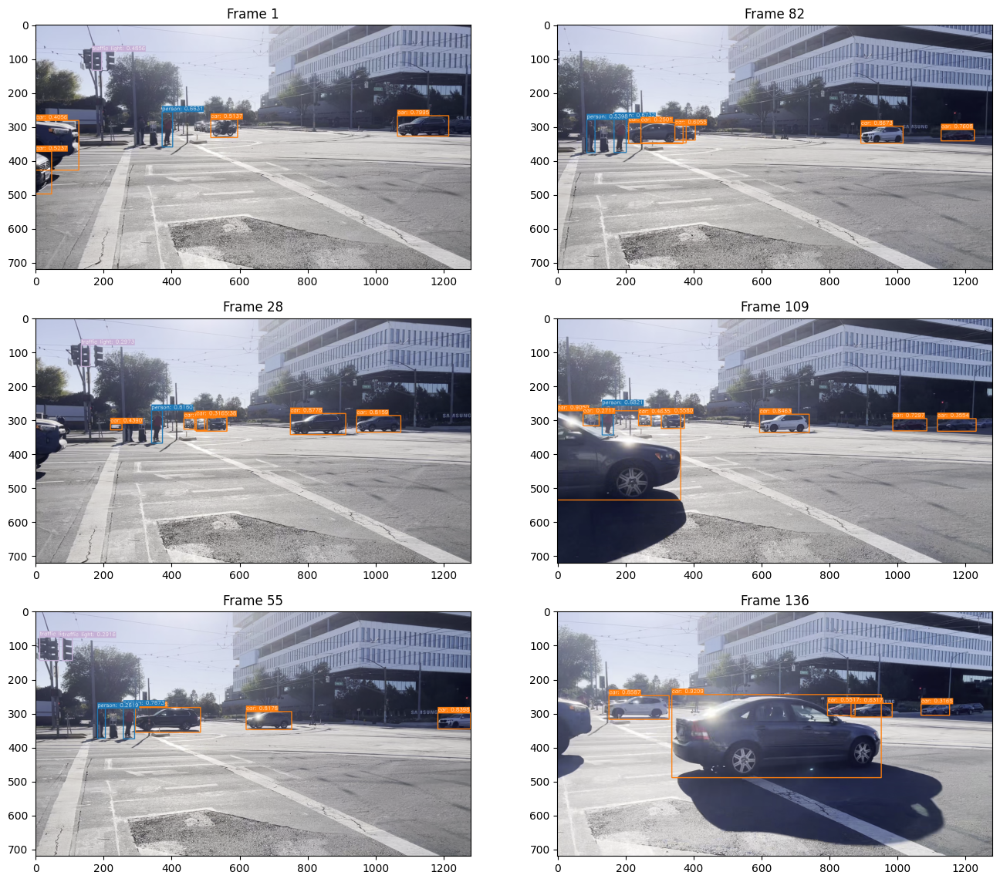

In [26]:
# sample frames from the converted video
fig, ax = plt.subplots(3, 2, figsize=(16,14))
for i in range(6):
    _ = ax[i % 3][i // 3].imshow(new_frames[27*i], vmin=0, vmax=255)
    _ = ax[i % 3][i // 3].set_title(f"Frame {27*i + 1}")

## Part 2 - Using Yolo V8

In [27]:
MODEL_NAME = "yolov8n"
DATASET_FOLDER = os.path.abspath("aiHub.v1i.yolov8")

In [28]:
# create the Yolo V8 model
model = YOLO(model=f"{MODEL_NAME}.pt", task="detect", verbose=False)
# move the model to hardware accelarator for speed up
model = model.to(device=DEVICE.type)

### Dataset Statistics

In [29]:
def count_images_per_class(dataset_path):
    # create a dictionary to collect the statistics for each partition
    partitions = ['train', 'valid', 'test']
    stats = {partition: defaultdict(int) for partition in partitions}
    # iterate over the partitions
    for partition in partitions:
        partition_path = Path(dataset_path) / partition
        labels_path = partition_path / 'labels'
        # read the labels associated with each image from the labels folder
        for label_file in labels_path.glob('*.txt'):
            with open(label_file, 'r') as f:
                for line in f:
                    # the first entry in each line of label file is the class
                    class_id = int(line.split()[0])
                    # update the count for this partition and class_id
                    stats[partition][class_id] += 1
    return stats

In [30]:
def print_stats(stats):
    for partition, class_counts in stats.items():
        print(f"\n{partition.capitalize()} partition:")
        for class_id, count in sorted(class_counts.items()):
            print(f"  Class {model.names[class_id]}: {count} images")

In [31]:
stats = count_images_per_class(DATASET_FOLDER)
print_stats(stats)


Train partition:
  Class person: 105 images
  Class bicycle: 222 images
  Class car: 108 images
  Class motorcycle: 153 images
  Class airplane: 90 images
  Class bus: 207 images

Valid partition:
  Class person: 18 images
  Class bicycle: 8 images
  Class car: 13 images
  Class motorcycle: 14 images
  Class airplane: 7 images
  Class bus: 22 images

Test partition:
  Class person: 6 images
  Class bicycle: 4 images
  Class car: 5 images
  Class motorcycle: 12 images
  Class airplane: 4 images
  Class bus: 14 images


### Model Training

In [32]:
# train the model using the Custom Dataset
results = model.train(
    data=os.path.join(DATASET_FOLDER, "data.yaml"),
    epochs=100,
    device=DEVICE.type,
)

Ultralytics 8.3.0 🚀 Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/aiHub.v1i.yolov8/data.yaml, epochs=100, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=cuda, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, s

100%|██████████| 755k/755k [00:00<00:00, 21.2MB/s]


Overriding model.yaml nc=80 with nc=6

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

/usr/local/lib/python3.10/dist-packages/ultralytics/utils/torch_utils.py:254: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  fusedconv.weight.copy_(torch.mm(w_bn, w_conv).view(fusedconv.weight.shape))
/usr/local/lib/python3.10/dist-packages/ultralytics/utils/torch_utils.py:259: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operati

AMP: checks passed ✅


train: Scanning /content/aiHub.v1i.yolov8/train/labels... 534 images, 0 backgrounds, 0 corrupt: 100%|██████████| 534/534 [00:00<00:00, 1850.67it/s]


train: New cache created: /content/aiHub.v1i.yolov8/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/local/lib/python3.10/dist-packages/albumentations/__init__.py:13: UserWarning: A new version of Albumentations is available: 1.4.16 (you have 1.4.15). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
val: Scanning /content/aiHub.v1i.yolov8/valid/labels... 51 images, 0 backgrounds, 0 corrupt: 100%|██████████| 51/51 [00:00<00:00, 2520.70it/s]

val: New cache created: /content/aiHub.v1i.yolov8/valid/labels.cache


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001, momentum=0.9) with parameter groups 63 weight(decay=0.0), 70 weight(decay=0.0005), 69 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/34 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      1/100      6.54G      1.117      3.441      1.446         25        640: 100%|██████████| 34/34 [00:11<00:00,  2.98it/s]
                 Class     Images  Instances      Box(P          R      

                   all         51         82     0.0243      0.622      0.106     0.0603



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/34 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      2/100      2.23G      1.038      3.024      1.406         24        640: 100%|██████████| 34/34 [00:08<00:00,  3.84it/s]
                 Class     Images  Instances      Box(P          R      

                   all         51         82     0.0115       0.81      0.133      0.067



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/34 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      3/100      2.23G      1.183      2.685      1.482         34        640: 100%|██████████| 34/34 [00:11<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      

                   all         51         82      0.487     0.0955      0.255      0.111

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/34 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      4/100       2.2G       1.17      2.576       1.49         21        640: 100%|██████████| 34/34 [00:09<00:00,  3.62it/s]
                 Class     Images  Instances      Box(P          R      

                   all         51         82      0.506       0.23      0.239      0.123



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/34 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      5/100      2.22G      1.159      2.479      1.483         21        640: 100%|██████████| 34/34 [00:08<00:00,  3.87it/s]
                 Class     Images  Instances      Box(P          R      

                   all         51         82      0.408      0.318      0.347      0.207



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/34 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      6/100      2.22G        1.1       2.26      1.439         22        640: 100%|██████████| 34/34 [00:11<00:00,  2.89it/s]
                 Class     Images  Instances      Box(P          R      

                   all         51         82      0.188      0.376      0.217      0.107



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/34 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      7/100      2.19G      1.109      2.203      1.433         15        640: 100%|██████████| 34/34 [00:09<00:00,  3.67it/s]
                 Class     Images  Instances      Box(P          R      

                   all         51         82       0.23      0.338      0.221      0.114



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/34 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      8/100      2.22G      1.056      2.123      1.414         20        640: 100%|██████████| 34/34 [00:08<00:00,  3.89it/s]
                 Class     Images  Instances      Box(P          R      

                   all         51         82      0.271      0.474      0.361      0.224



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/34 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      9/100      2.19G      1.059      2.053       1.41         14        640: 100%|██████████| 34/34 [00:11<00:00,  3.04it/s]
                 Class     Images  Instances      Box(P          R      

                   all         51         82      0.315      0.411      0.311        0.2



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/34 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
     10/100      2.18G      1.054      1.898      1.385         30        640: 100%|██████████| 34/34 [00:09<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      

                   all         51         82      0.369      0.441      0.422      0.274



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/34 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
     11/100      2.21G      1.051       1.86      1.366         28        640: 100%|██████████| 34/34 [00:09<00:00,  3.78it/s]
                 Class     Images  Instances      Box(P          R      

                   all         51         82      0.462      0.503      0.508      0.285



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/34 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
     12/100       2.2G      1.049      1.831      1.381         18        640: 100%|██████████| 34/34 [00:11<00:00,  3.04it/s]
                 Class     Images  Instances      Box(P          R      

                   all         51         82      0.394      0.441      0.418      0.226



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/34 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
     13/100      2.19G      1.019      1.759      1.361         25        640: 100%|██████████| 34/34 [00:08<00:00,  3.90it/s]
                 Class     Images  Instances      Box(P          R      

                   all         51         82      0.492      0.466      0.425      0.242



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/34 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
     14/100      2.21G      1.009      1.736      1.353         20        640: 100%|██████████| 34/34 [00:08<00:00,  3.88it/s]
                 Class     Images  Instances      Box(P          R      

                   all         51         82       0.53      0.409      0.451      0.255



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/34 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
     15/100      2.26G     0.9543      1.663       1.32         25        640: 100%|██████████| 34/34 [00:11<00:00,  3.05it/s]
                 Class     Images  Instances      Box(P          R      

                   all         51         82      0.603      0.486      0.536      0.293



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/34 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
     16/100      2.21G     0.9563      1.623      1.328         23        640: 100%|██████████| 34/34 [00:15<00:00,  2.18it/s]
                 Class     Images  Instances      Box(P          R      

                   all         51         82      0.676      0.395      0.522      0.298



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/34 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
     17/100      2.21G     0.9394      1.577      1.298         21        640: 100%|██████████| 34/34 [00:12<00:00,  2.69it/s]
                 Class     Images  Instances      Box(P          R      

                   all         51         82      0.561      0.538      0.545      0.331



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/34 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
     18/100      2.22G     0.9337      1.481      1.308         17        640: 100%|██████████| 34/34 [00:08<00:00,  4.20it/s]
                 Class     Images  Instances      Box(P          R      

                   all         51         82      0.553      0.592      0.571      0.376



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/34 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
     19/100      2.21G      0.952      1.496      1.315         14        640: 100%|██████████| 34/34 [00:10<00:00,  3.18it/s]
                 Class     Images  Instances      Box(P          R      

                   all         51         82      0.647      0.569      0.573      0.373



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/34 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
     20/100      2.21G     0.9569      1.452      1.301         22        640: 100%|██████████| 34/34 [00:10<00:00,  3.13it/s]
                 Class     Images  Instances      Box(P          R      

                   all         51         82      0.546       0.58      0.546       0.37



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/34 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
     21/100      2.21G     0.9101       1.39      1.278         21        640: 100%|██████████| 34/34 [00:08<00:00,  4.03it/s]
                 Class     Images  Instances      Box(P          R      

                   all         51         82      0.608      0.596      0.612      0.366

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/34 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
     22/100      2.22G     0.9093      1.458      1.299         35        640: 100%|██████████| 34/34 [00:10<00:00,  3.10it/s]
                 Class     Images  Instances      Box(P          R      

                   all         51         82      0.531      0.552      0.513      0.327

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/34 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
     23/100      2.24G     0.9009      1.437      1.296         17        640: 100%|██████████| 34/34 [00:12<00:00,  2.81it/s]
                 Class     Images  Instances      Box(P          R      

                   all         51         82      0.462      0.507       0.54      0.357



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/34 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
     24/100      2.19G     0.9009      1.379      1.289         15        640: 100%|██████████| 34/34 [00:08<00:00,  3.80it/s]
                 Class     Images  Instances      Box(P          R      

                   all         51         82      0.506      0.459      0.484      0.294



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/34 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
     25/100      2.22G     0.8396       1.32      1.238         20        640: 100%|██████████| 34/34 [00:09<00:00,  3.55it/s]
                 Class     Images  Instances      Box(P          R      

                   all         51         82      0.551      0.608       0.61      0.396



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/34 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
     26/100       2.2G     0.8682      1.261      1.228         21        640: 100%|██████████| 34/34 [00:11<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      

                   all         51         82      0.736      0.535      0.602      0.386



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/34 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
     27/100      2.24G     0.9002      1.343       1.27         16        640: 100%|██████████| 34/34 [00:08<00:00,  4.02it/s]
                 Class     Images  Instances      Box(P          R      

                   all         51         82      0.494      0.623       0.59      0.357



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/34 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
     28/100      2.21G     0.8292      1.243      1.212         25        640: 100%|██████████| 34/34 [00:09<00:00,  3.61it/s]
                 Class     Images  Instances      Box(P          R      

                   all         51         82      0.395      0.556      0.544      0.313



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/34 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
     29/100      2.23G     0.8122        1.2      1.218         22        640: 100%|██████████| 34/34 [00:10<00:00,  3.11it/s]
                 Class     Images  Instances      Box(P          R      

                   all         51         82      0.553      0.607      0.618      0.406



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/34 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
     30/100       2.2G     0.8374      1.145      1.226         39        640: 100%|██████████| 34/34 [00:08<00:00,  3.88it/s]
                 Class     Images  Instances      Box(P          R      

                   all         51         82      0.714      0.435       0.51      0.294



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/34 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
     31/100      2.23G     0.8688      1.199      1.258         21        640: 100%|██████████| 34/34 [00:09<00:00,  3.76it/s]
                 Class     Images  Instances      Box(P          R      

                   all         51         82      0.559      0.691      0.629      0.411



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/34 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
     32/100      2.22G      0.845      1.173      1.239         23        640: 100%|██████████| 34/34 [00:11<00:00,  2.98it/s]
                 Class     Images  Instances      Box(P          R      

                   all         51         82      0.563      0.504      0.546      0.354



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/34 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
     33/100      2.22G     0.8039      1.132      1.195         28        640: 100%|██████████| 34/34 [00:08<00:00,  4.00it/s]
                 Class     Images  Instances      Box(P          R      

                   all         51         82      0.632      0.527      0.578      0.411



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/34 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
     34/100      2.21G     0.8288       1.16      1.233         21        640: 100%|██████████| 34/34 [00:10<00:00,  3.36it/s]
                 Class     Images  Instances      Box(P          R      

                   all         51         82      0.688      0.571      0.672      0.467



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/34 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
     35/100      2.22G     0.8173      1.159      1.211         30        640: 100%|██████████| 34/34 [00:10<00:00,  3.10it/s]
                 Class     Images  Instances      Box(P          R      

                   all         51         82      0.533      0.548      0.595      0.365



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/34 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
     36/100      2.19G      0.806      1.135      1.211         21        640: 100%|██████████| 34/34 [00:08<00:00,  4.04it/s]
                 Class     Images  Instances      Box(P          R      

                   all         51         82      0.745      0.606      0.664      0.431



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/34 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
     37/100      2.18G     0.8229      1.102      1.213         27        640: 100%|██████████| 34/34 [00:09<00:00,  3.58it/s]
                 Class     Images  Instances      Box(P          R      

                   all         51         82      0.686      0.566      0.622      0.425



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/34 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
     38/100      2.21G     0.7989      1.066      1.205         22        640: 100%|██████████| 34/34 [00:11<00:00,  3.06it/s]
                 Class     Images  Instances      Box(P          R      

                   all         51         82      0.504       0.64      0.645      0.427



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/34 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
     39/100       2.2G     0.7939      1.043      1.192         22        640: 100%|██████████| 34/34 [00:08<00:00,  4.13it/s]
                 Class     Images  Instances      Box(P          R      

                   all         51         82      0.696      0.561      0.671      0.456



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/34 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
     40/100      2.26G      0.764      1.028      1.194         20        640: 100%|██████████| 34/34 [00:09<00:00,  3.49it/s]
                 Class     Images  Instances      Box(P          R      

                   all         51         82      0.687      0.517       0.64      0.451



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/34 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
     41/100      2.21G     0.7964      1.043      1.207         21        640: 100%|██████████| 34/34 [00:10<00:00,  3.11it/s]
                 Class     Images  Instances      Box(P          R      

                   all         51         82      0.616      0.615      0.638      0.436



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/34 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
     42/100      2.22G     0.7725      1.027      1.183         24        640: 100%|██████████| 34/34 [00:08<00:00,  4.10it/s]
                 Class     Images  Instances      Box(P          R      

                   all         51         82      0.577      0.493      0.569      0.367



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/34 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
     43/100       2.2G     0.7623     0.9831      1.183         25        640: 100%|██████████| 34/34 [00:09<00:00,  3.56it/s]
                 Class     Images  Instances      Box(P          R      

                   all         51         82      0.589      0.726      0.721      0.512



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/34 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
     44/100      2.21G     0.7625     0.9796      1.179         15        640: 100%|██████████| 34/34 [00:11<00:00,  2.96it/s]
                 Class     Images  Instances      Box(P          R      

                   all         51         82      0.641      0.639      0.659      0.489



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/34 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
     45/100       2.2G      0.803     0.9821      1.204         21        640: 100%|██████████| 34/34 [00:08<00:00,  3.84it/s]
                 Class     Images  Instances      Box(P          R      

                   all         51         82      0.689      0.691      0.692      0.472



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/34 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
     46/100      2.23G     0.7621     0.9765      1.184         17        640: 100%|██████████| 34/34 [00:09<00:00,  3.43it/s]
                 Class     Images  Instances      Box(P          R      

                   all         51         82       0.58      0.678       0.66      0.478



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/34 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
     47/100       2.2G     0.7408     0.9481      1.185         18        640: 100%|██████████| 34/34 [00:12<00:00,  2.78it/s]
                 Class     Images  Instances      Box(P          R      

                   all         51         82      0.606      0.654      0.672      0.477



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/34 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
     48/100      2.22G     0.7766     0.9913      1.177         17        640: 100%|██████████| 34/34 [00:09<00:00,  3.47it/s]
                 Class     Images  Instances      Box(P          R      

                   all         51         82      0.616      0.568      0.635       0.44



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/34 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
     49/100      2.21G     0.7695     0.9816      1.198         19        640: 100%|██████████| 34/34 [00:08<00:00,  3.95it/s]
                 Class     Images  Instances      Box(P          R      

                   all         51         82      0.691      0.616       0.68      0.489



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/34 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
     50/100      2.23G     0.7521     0.9429      1.197         15        640: 100%|██████████| 34/34 [00:10<00:00,  3.22it/s]
                 Class     Images  Instances      Box(P          R      

                   all         51         82      0.659      0.597      0.691      0.474



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/34 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
     51/100      2.21G     0.7394     0.9009      1.152         22        640: 100%|██████████| 34/34 [00:09<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      

                   all         51         82      0.564       0.64      0.664      0.467



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/34 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
     52/100      2.21G     0.7233     0.9042      1.154         14        640: 100%|██████████| 34/34 [00:08<00:00,  4.03it/s]
                 Class     Images  Instances      Box(P          R      

                   all         51         82      0.632      0.594      0.647      0.446



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/34 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
     53/100      2.22G     0.6803     0.8683       1.11         19        640: 100%|██████████| 34/34 [00:10<00:00,  3.10it/s]
                 Class     Images  Instances      Box(P          R      

                   all         51         82      0.617       0.72      0.702      0.497



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/34 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
     54/100      2.23G     0.6959     0.8545      1.139         20        640: 100%|██████████| 34/34 [00:09<00:00,  3.61it/s]
                 Class     Images  Instances      Box(P          R      

                   all         51         82      0.665      0.686       0.67      0.459



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/34 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
     55/100       2.2G     0.7044     0.8957      1.148         22        640: 100%|██████████| 34/34 [00:08<00:00,  4.09it/s]
                 Class     Images  Instances      Box(P          R      

                   all         51         82      0.766       0.54      0.663      0.456



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/34 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
     56/100       2.2G     0.7151     0.9102      1.159         24        640: 100%|██████████| 34/34 [00:11<00:00,  3.01it/s]
                 Class     Images  Instances      Box(P          R      

                   all         51         82      0.614      0.627       0.65      0.433



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/34 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
     57/100      2.27G     0.7106     0.8637      1.149         14        640: 100%|██████████| 34/34 [00:09<00:00,  3.74it/s]
                 Class     Images  Instances      Box(P          R      

                   all         51         82       0.69      0.603      0.686      0.474



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/34 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
     58/100      2.21G     0.7009     0.8626      1.155         34        640: 100%|██████████| 34/34 [00:08<00:00,  3.91it/s]
                 Class     Images  Instances      Box(P          R      

                   all         51         82      0.665      0.644      0.708      0.437



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/34 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
     59/100      2.21G     0.6738     0.8184      1.136         13        640: 100%|██████████| 34/34 [00:11<00:00,  3.04it/s]
                 Class     Images  Instances      Box(P          R      

                   all         51         82      0.704      0.629      0.713      0.492



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/34 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
     60/100      2.24G     0.7178     0.8967      1.155         14        640: 100%|██████████| 34/34 [00:08<00:00,  3.89it/s]
                 Class     Images  Instances      Box(P          R      

                   all         51         82      0.612      0.607      0.663      0.464



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/34 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
     61/100      2.21G     0.7005     0.8461      1.134         36        640: 100%|██████████| 34/34 [00:09<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      

                   all         51         82      0.731      0.679      0.702      0.504



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/34 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
     62/100      2.26G     0.6839     0.8335      1.132         14        640: 100%|██████████| 34/34 [00:11<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      

                   all         51         82      0.525      0.686       0.65      0.478



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/34 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
     63/100      2.23G     0.7029     0.8168      1.159         17        640: 100%|██████████| 34/34 [00:08<00:00,  3.90it/s]
                 Class     Images  Instances      Box(P          R      

                   all         51         82      0.743      0.646      0.708      0.508



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/34 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
     64/100      2.21G      0.677     0.7969      1.113         34        640: 100%|██████████| 34/34 [00:09<00:00,  3.65it/s]
                 Class     Images  Instances      Box(P          R      

                   all         51         82      0.687      0.695      0.721      0.523



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/34 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
     65/100      2.21G     0.6564     0.7763      1.112         21        640: 100%|██████████| 34/34 [00:11<00:00,  2.97it/s]
                 Class     Images  Instances      Box(P          R      

                   all         51         82      0.612      0.715      0.723       0.53



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/34 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
     66/100      2.21G     0.6852     0.8003      1.125         21        640: 100%|██████████| 34/34 [00:08<00:00,  3.93it/s]
                 Class     Images  Instances      Box(P          R      

                   all         51         82      0.553      0.698      0.692      0.483



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/34 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
     67/100      2.21G      0.653      0.762      1.109         29        640: 100%|██████████| 34/34 [00:09<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      

                   all         51         82       0.73      0.613        0.7      0.513

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/34 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
     68/100      2.22G     0.6393     0.7458      1.099         17        640: 100%|██████████| 34/34 [00:10<00:00,  3.11it/s]
                 Class     Images  Instances      Box(P          R      

                   all         51         82      0.771      0.638      0.728      0.522



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/34 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
     69/100      2.21G     0.6693     0.7573       1.11         24        640: 100%|██████████| 34/34 [00:08<00:00,  3.95it/s]
                 Class     Images  Instances      Box(P          R      

                   all         51         82      0.699      0.644      0.743      0.548



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/34 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
     70/100      2.21G      0.633     0.7203      1.091         20        640: 100%|██████████| 34/34 [00:09<00:00,  3.46it/s]
                 Class     Images  Instances      Box(P          R      

                   all         51         82      0.574      0.712      0.699      0.514



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/34 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
     71/100      2.21G      0.641     0.7372      1.104         26        640: 100%|██████████| 34/34 [00:11<00:00,  2.97it/s]
                 Class     Images  Instances      Box(P          R      

                   all         51         82      0.798      0.568      0.706      0.528

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/34 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
     72/100      2.21G     0.6278     0.6968      1.089         28        640: 100%|██████████| 34/34 [00:08<00:00,  3.96it/s]
                 Class     Images  Instances      Box(P          R      

                   all         51         82      0.678      0.682      0.697      0.526



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/34 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
     73/100      2.21G     0.6549     0.7451      1.111         22        640: 100%|██████████| 34/34 [00:09<00:00,  3.51it/s]
                 Class     Images  Instances      Box(P          R      

                   all         51         82      0.755      0.622      0.715      0.525



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/34 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
     74/100      2.26G     0.6387     0.7138      1.102         16        640: 100%|██████████| 34/34 [00:10<00:00,  3.16it/s]
                 Class     Images  Instances      Box(P          R      

                   all         51         82      0.734      0.608      0.712      0.509



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/34 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
     75/100      2.23G     0.6294      0.704      1.108         15        640: 100%|██████████| 34/34 [00:08<00:00,  4.03it/s]
                 Class     Images  Instances      Box(P          R      

                   all         51         82      0.561       0.55      0.607      0.377



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/34 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
     76/100      2.22G     0.6422      0.726      1.109         25        640: 100%|██████████| 34/34 [00:09<00:00,  3.42it/s]
                 Class     Images  Instances      Box(P          R      

                   all         51         82      0.633      0.721      0.721      0.547



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/34 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
     77/100      2.19G     0.6221     0.7167        1.1         23        640: 100%|██████████| 34/34 [00:10<00:00,  3.11it/s]
                 Class     Images  Instances      Box(P          R      

                   all         51         82      0.703       0.69      0.724      0.551



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/34 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
     78/100       2.2G     0.6111     0.7092      1.084         25        640: 100%|██████████| 34/34 [00:08<00:00,  4.01it/s]
                 Class     Images  Instances      Box(P          R      

                   all         51         82      0.639      0.719      0.722      0.562



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/34 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
     79/100       2.2G      0.611     0.6813      1.091         26        640: 100%|██████████| 34/34 [00:10<00:00,  3.36it/s]
                 Class     Images  Instances      Box(P          R      

                   all         51         82      0.756      0.731      0.729      0.562

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/34 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
     80/100      2.22G     0.6108     0.7069      1.086         26        640: 100%|██████████| 34/34 [00:10<00:00,  3.21it/s]
                 Class     Images  Instances      Box(P          R      

                   all         51         82      0.796      0.722      0.727      0.562



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/34 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
     81/100      2.21G     0.6067     0.7021      1.086         22        640: 100%|██████████| 34/34 [00:08<00:00,  4.03it/s]
                 Class     Images  Instances      Box(P          R      

                   all         51         82      0.696      0.688      0.707      0.542



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/34 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
     82/100      2.21G     0.5856     0.6758      1.087         19        640: 100%|██████████| 34/34 [00:09<00:00,  3.62it/s]
                 Class     Images  Instances      Box(P          R      

                   all         51         82       0.71      0.664      0.702      0.547



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/34 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
     83/100      2.26G     0.6022     0.6814      1.083         16        640: 100%|██████████| 34/34 [00:11<00:00,  3.03it/s]
                 Class     Images  Instances      Box(P          R      

                   all         51         82      0.771      0.601      0.699      0.529



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/34 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
     84/100      2.22G     0.6018     0.6781      1.099         25        640: 100%|██████████| 34/34 [00:08<00:00,  4.00it/s]
                 Class     Images  Instances      Box(P          R      

                   all         51         82      0.685      0.606      0.707      0.514



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/34 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
     85/100      2.21G     0.5949     0.6703      1.076         29        640: 100%|██████████| 34/34 [00:09<00:00,  3.61it/s]
                 Class     Images  Instances      Box(P          R      

                   all         51         82      0.733      0.641      0.714      0.531



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/34 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
     86/100       2.2G     0.5728     0.6444      1.072         12        640: 100%|██████████| 34/34 [00:11<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      

                   all         51         82      0.761      0.634       0.72      0.553



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/34 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
     87/100      2.21G     0.5896     0.6706      1.074         17        640: 100%|██████████| 34/34 [00:08<00:00,  4.02it/s]
                 Class     Images  Instances      Box(P          R      

                   all         51         82       0.71      0.688      0.715      0.523



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/34 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
     88/100      2.22G     0.5825     0.6415      1.068         12        640: 100%|██████████| 34/34 [00:09<00:00,  3.42it/s]
                 Class     Images  Instances      Box(P          R      

                   all         51         82      0.696      0.704      0.714      0.533



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/34 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
     89/100      2.23G     0.5854     0.6488      1.089         25        640: 100%|██████████| 34/34 [00:11<00:00,  3.02it/s]
                 Class     Images  Instances      Box(P          R      

                   all         51         82      0.706      0.721      0.736      0.547



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/34 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
     90/100      2.21G     0.5749     0.6529      1.073         40        640: 100%|██████████| 34/34 [00:08<00:00,  4.03it/s]
                 Class     Images  Instances      Box(P          R      

                   all         51         82      0.704      0.674      0.724      0.538


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/34 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
     91/100      2.26G     0.4103     0.5481     0.9817         13        640: 100%|██████████| 34/34 [00:10<00:00,  3.39it/s]
                 Class     Images  Instances      Box(P          R      

                   all         51         82      0.659      0.679      0.708      0.525



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/34 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
     92/100      2.22G     0.4061     0.4845     0.9694          6        640: 100%|██████████| 34/34 [00:11<00:00,  3.03it/s]
                 Class     Images  Instances      Box(P          R      

                   all         51         82      0.676      0.683      0.708      0.563

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/34 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
     93/100      2.22G     0.3945     0.4471     0.9769          6        640: 100%|██████████| 34/34 [00:09<00:00,  3.75it/s]
                 Class     Images  Instances      Box(P          R      

                   all         51         82      0.653      0.681       0.69      0.541



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/34 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
     94/100      2.22G     0.3841      0.445      0.973         17        640: 100%|██████████| 34/34 [00:09<00:00,  3.76it/s]
                 Class     Images  Instances      Box(P          R      

                   all         51         82      0.701      0.693      0.707      0.524



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/34 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
     95/100      2.19G     0.3735     0.4293     0.9757          9        640: 100%|██████████| 34/34 [00:10<00:00,  3.10it/s]
                 Class     Images  Instances      Box(P          R      

                   all         51         82      0.712      0.671      0.708      0.532



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/34 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
     96/100      2.22G     0.3712     0.4052      0.959          6        640: 100%|██████████| 34/34 [00:07<00:00,  4.33it/s]
                 Class     Images  Instances      Box(P          R      

                   all         51         82      0.734      0.668      0.702      0.541



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/34 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
     97/100      2.22G     0.3659     0.4071     0.9455          6        640: 100%|██████████| 34/34 [00:10<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      

                   all         51         82      0.753      0.688      0.707      0.522



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/34 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
     98/100      2.23G     0.3724     0.4039     0.9608          8        640: 100%|██████████| 34/34 [00:10<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      

                   all         51         82      0.715      0.685      0.702      0.527



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/34 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
     99/100       2.2G      0.362     0.4029     0.9461         13        640: 100%|██████████| 34/34 [00:07<00:00,  4.33it/s]
                 Class     Images  Instances      Box(P          R      

                   all         51         82      0.726      0.679      0.716      0.546



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/34 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
    100/100      2.22G     0.3517     0.3935     0.9496          6        640: 100%|██████████| 34/34 [00:11<00:00,  3.07it/s]
                 Class     Images  Instances      Box(P          R      

                   all         51         82      0.703      0.684      0.716      0.537



100 epochs completed in 0.320 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 5.6MB
Optimizer stripped from runs/detect/train/weights/best.pt, 5.6MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.0 🚀 Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 186 layers, 2,685,538 parameters, 0 gradients, 6.8 GFLOPs


/usr/local/lib/python3.10/dist-packages/ultralytics/utils/torch_utils.py:254: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  fusedconv.weight.copy_(torch.mm(w_bn, w_conv).view(fusedconv.weight.shape))
/usr/local/lib/python3.10/dist-packages/ultralytics/utils/torch_utils.py:259: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operati

                   all         51         82       0.75      0.731      0.724       0.56
                Hammer          7         18      0.987      0.778      0.922      0.741
                Pliers          7          8      0.748      0.742      0.702      0.559
                  Rope         12         13      0.872      0.846       0.84      0.634
          Screw Driver          8         14      0.388      0.429      0.313      0.197
              Tool Box          6          7      0.737          1      0.944      0.723
                Wrench         12         22      0.765      0.591      0.623      0.509
Speed: 0.3ms preprocess, 2.4ms inference, 0.0ms loss, 2.8ms postprocess per image
Results saved to runs/detect/train


In [33]:
BEST_MODEL_FOLDER = os.path.join(str(results.save_dir), "weights")

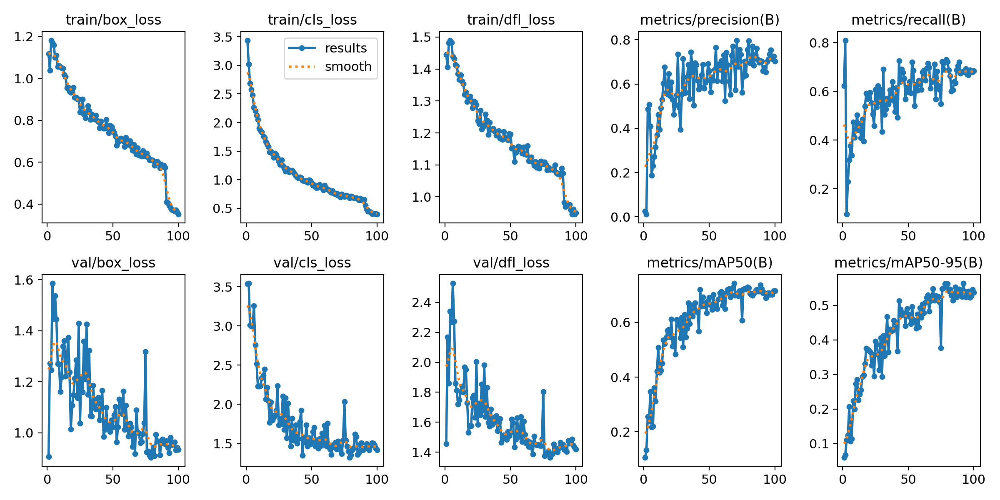

In [34]:
# plot the training curves and metrics
img = Image.open(os.path.join(str(results.save_dir), "results.png"))
img

From the training curves seen above, we can make the following observations based on the training for 100 epochs -

- there was a steep decrease in the training loss at around epoch 90, but the same could not be said for validation loss.
- the validation loss had started to increase when the training had stopped. This indicates that the training stopped at the right time before the model started overfitting.
- the precision and recall metrics had started to flatten on the validation set when the training was stopped.
- the mean Average Precision at 50% threshold (mAP50) had settled at around 0.7 before the training had stopped.
- the mean Average Precision at 50-95% threshold (mAP50-95) had settled at around 0.5 before the training had stopped.

### Model Validation

In [35]:
# create the Yolo V8 model using the best weights from training
model_weights_path = os.path.join(BEST_MODEL_FOLDER, "best.pt")
model = YOLO(model=model_weights_path, task="detect", verbose=False)
# move the model to hardware accelarator for speed up
model = model.to(device=DEVICE.type)
# run the model on validation set
results = model.val(
    data=os.path.join(DATASET_FOLDER, "data.yaml"),
    device=DEVICE,
)

/usr/local/lib/python3.10/dist-packages/ultralytics/utils/torch_utils.py:254: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  fusedconv.weight.copy_(torch.mm(w_bn, w_conv).view(fusedconv.weight.shape))
/usr/local/lib/python3.10/dist-packages/ultralytics/utils/torch_utils.py:259: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operati

Model summary (fused): 186 layers, 2,685,538 parameters, 0 gradients, 6.8 GFLOPs


val: Scanning /content/aiHub.v1i.yolov8/valid/labels.cache... 51 images, 0 backgrounds, 0 corrupt: 100%|██████████| 51/51 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.43it/s]


                   all         51         82      0.756       0.73       0.73      0.562
                Hammer          7         18          1      0.775      0.922      0.734
                Pliers          7          8      0.767       0.75      0.754      0.593
                  Rope         12         13      0.875      0.846       0.84      0.633
          Screw Driver          8         14      0.391      0.429      0.313      0.197
              Tool Box          6          7      0.739          1      0.924      0.702
                Wrench         12         22      0.762      0.582      0.624       0.51
Speed: 0.4ms preprocess, 22.4ms inference, 0.0ms loss, 4.6ms postprocess per image
Results saved to runs/detect/val


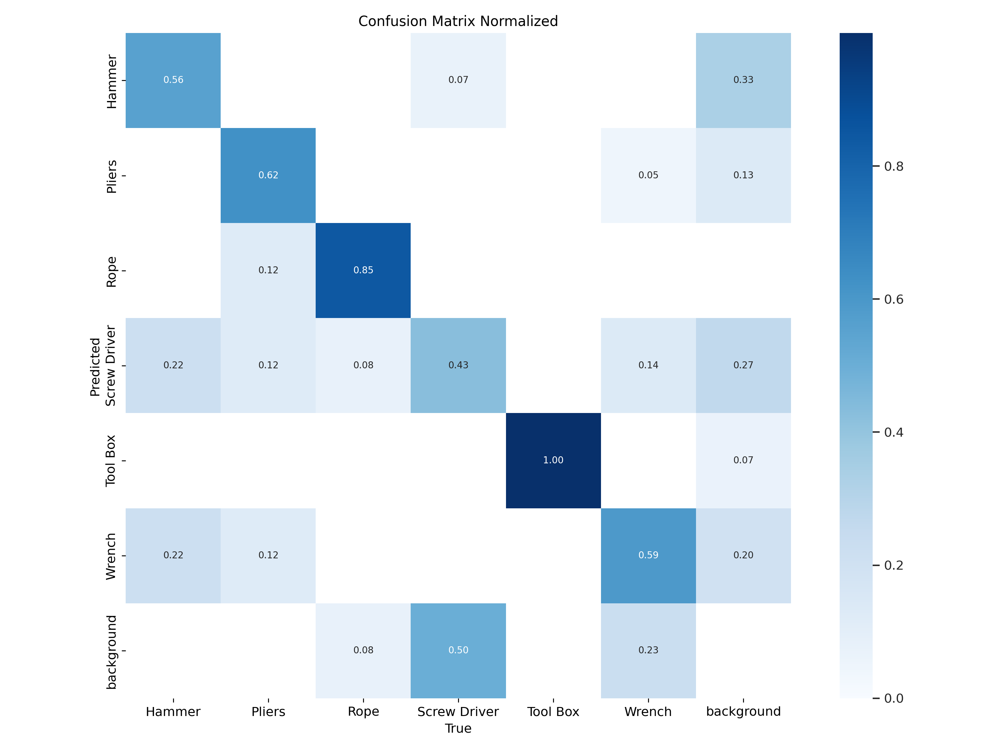

In [36]:
# confusion Matrix for the Validation set
img = Image.open(os.path.join(str(results.save_dir), "confusion_matrix_normalized.png"))
img

Based on the confusion matrix for validation set, the following observations can be made -

- the model is really good at identifying tool box, followed by rope and pliers.
- the model is not good at identifying hammers from the background or other classes.
- the screw driver was predicted as a background object more frequently compared to all other classes.

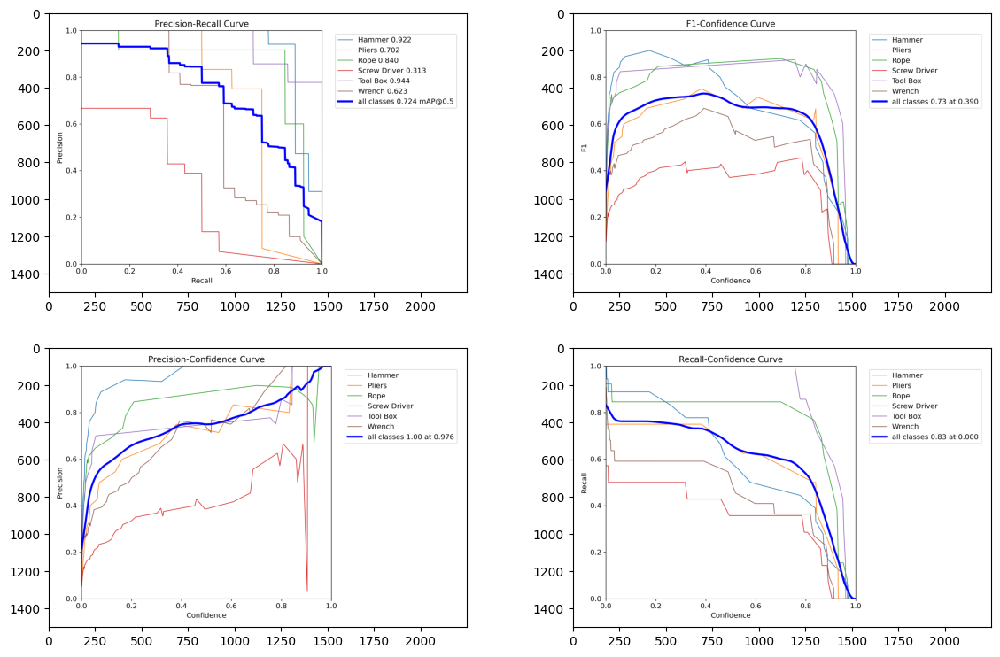

In [37]:
fig, ax = plt.subplots(2, 2, figsize=(14, 9))
# precision-recall curve for the Validation set
img = Image.open("runs/detect/train/PR_curve.png")
_ = ax[0][0].imshow(img)
# f1-score curve for the Validation set
img = Image.open("runs/detect/train/F1_curve.png")
_ = ax[0][1].imshow(img)
# precision curve for the Validation set
img = Image.open("runs/detect/train/P_curve.png")
_ = ax[1][0].imshow(img)
# recall curve for the Validation set
img = Image.open("runs/detect/train/R_curve.png")
_ = ax[1][1].imshow(img)

Based on the curves for the validation set, we can make the following observations -

- the PR curve for Tool Box, Hammer and Rope is higher than the PR curve for all classes combined.
- the F1 curve for Hammer, Pliers and Rope is higher than the F1 curve for all classes combined.
- the Precision curve for Hammer, Rope and Wrench is higher than the Precision curve for all classes combined.
- the Recall curve for Tool Box, Pliers and Rope is higher than the Recall curve for all classes combined.

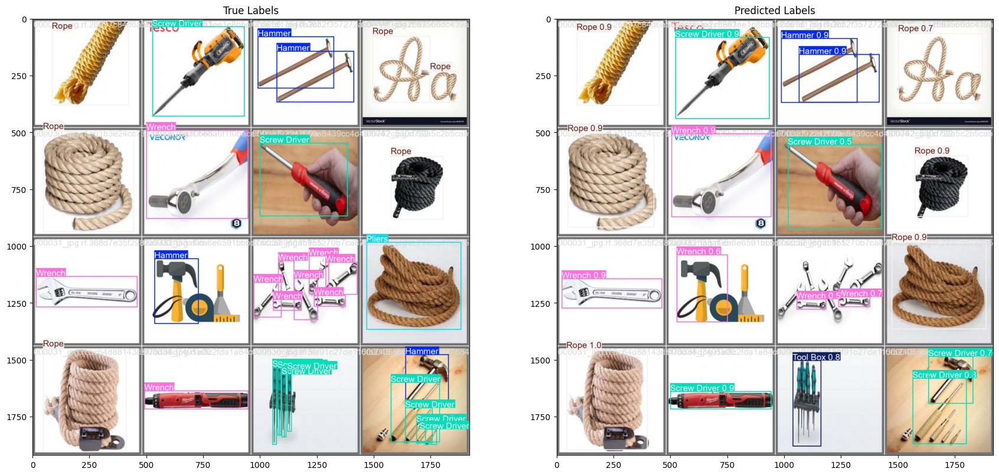

In [38]:
# plotting the first batch and their corresponding predictions
fig, ax = plt.subplots(1, 2, figsize=(21, 10))
true_label_imgs = Image.open(os.path.join(str(results.save_dir), "val_batch0_labels.jpg"))
_ = ax[0].imshow(np.array(true_label_imgs))
_ = ax[0].set_title("True Labels")
pred_label_imgs = Image.open(os.path.join(str(results.save_dir), "val_batch0_pred.jpg"))
_ = ax[1].set_title("Predicted Labels")
_ = ax[1].imshow(np.array(pred_label_imgs))

We can that some examples in the Validation dataset are actually annotated incorrectly -

- A screw driver is probably marked as a plier on the Validation dataset (2nd row, end of right)
- A hammer has been marked as Screw Driver (4th row, end of right)

From the predicted labels, we can see that the model did make some mistakes in the class prediction -

- Hammer has been marked as Wrench (first row, 2nd from left)
- A wrench mas been identified as Screw Driver (third row, end of right)
- A couple of wrenches in the last row have been misidentified as screw driver.
- A hammer has been marked as wrench.

### Predictions on the Test Dataset

In [39]:
# create the Yolo V8 model using the best weights from training
model_weights_path = os.path.join(BEST_MODEL_FOLDER, "best.pt")
model = YOLO(model=model_weights_path, task="detect", verbose=False)
# move the model to hardware accelarator for speed up
model = model.to(device=DEVICE.type)
results = model.predict(os.path.join(DATASET_FOLDER, os.path.join("test", "images")))


image 1/26 /content/aiHub.v1i.yolov8/test/images/000002_jpg.rf.3fe959f5175a87e988c5a5f69d779fcd.jpg: 640x640 1 Rope, 9.4ms
image 2/26 /content/aiHub.v1i.yolov8/test/images/000007_jpg.rf.4fea82fe27d57392d3bea4fee5d955f2.jpg: 640x640 1 Rope, 9.1ms
image 3/26 /content/aiHub.v1i.yolov8/test/images/000007_jpg.rf.60dbc245bf7d0b7c5455cf7333f99164.jpg: 640x640 5 Wrenchs, 7.1ms
image 4/26 /content/aiHub.v1i.yolov8/test/images/000008_jpg.rf.1c9fac7314f7c395684d767630d8435a.jpg: 640x640 1 Screw Driver, 7.2ms


/usr/local/lib/python3.10/dist-packages/ultralytics/utils/torch_utils.py:254: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  fusedconv.weight.copy_(torch.mm(w_bn, w_conv).view(fusedconv.weight.shape))
/usr/local/lib/python3.10/dist-packages/ultralytics/utils/torch_utils.py:259: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operati

image 5/26 /content/aiHub.v1i.yolov8/test/images/000008_jpg.rf.2ec3ae0f45aad59174c2139b1ab2c04c.jpg: 640x640 1 Hammer, 7.1ms
image 6/26 /content/aiHub.v1i.yolov8/test/images/000008_jpg.rf.92c9368abc042a5793ad34a08e16ccc7.jpg: 640x640 1 Tool Box, 7.1ms
image 7/26 /content/aiHub.v1i.yolov8/test/images/000013_jpg.rf.e379ee03d9b72a5439ae32dbb693de3a.jpg: 640x640 1 Rope, 7.1ms
image 8/26 /content/aiHub.v1i.yolov8/test/images/000016_jpg.rf.49caa35a4fa6c64f926aa19207624c03.jpg: 640x640 4 Plierss, 2 Wrenchs, 10.3ms
image 9/26 /content/aiHub.v1i.yolov8/test/images/000017_jpg.rf.dac6266dcf1b636cbbf68b83d5ef9e09.jpg: 640x640 1 Hammer, 10.3ms
image 10/26 /content/aiHub.v1i.yolov8/test/images/000023_jpg.rf.535ac4439de275270923da6cf2fe1430.jpg: 640x640 2 Hammers, 7.1ms
image 11/26 /content/aiHub.v1i.yolov8/test/images/000023_jpg.rf.d8c03e61b1a685979e5068df93d85e1c.jpg: 640x640 1 Rope, 7.1ms
image 12/26 /content/aiHub.v1i.yolov8/test/images/000026_jpg.rf.d510b7c6f0f3c2a9bc71bc7dad0db549.jpg: 640x640 

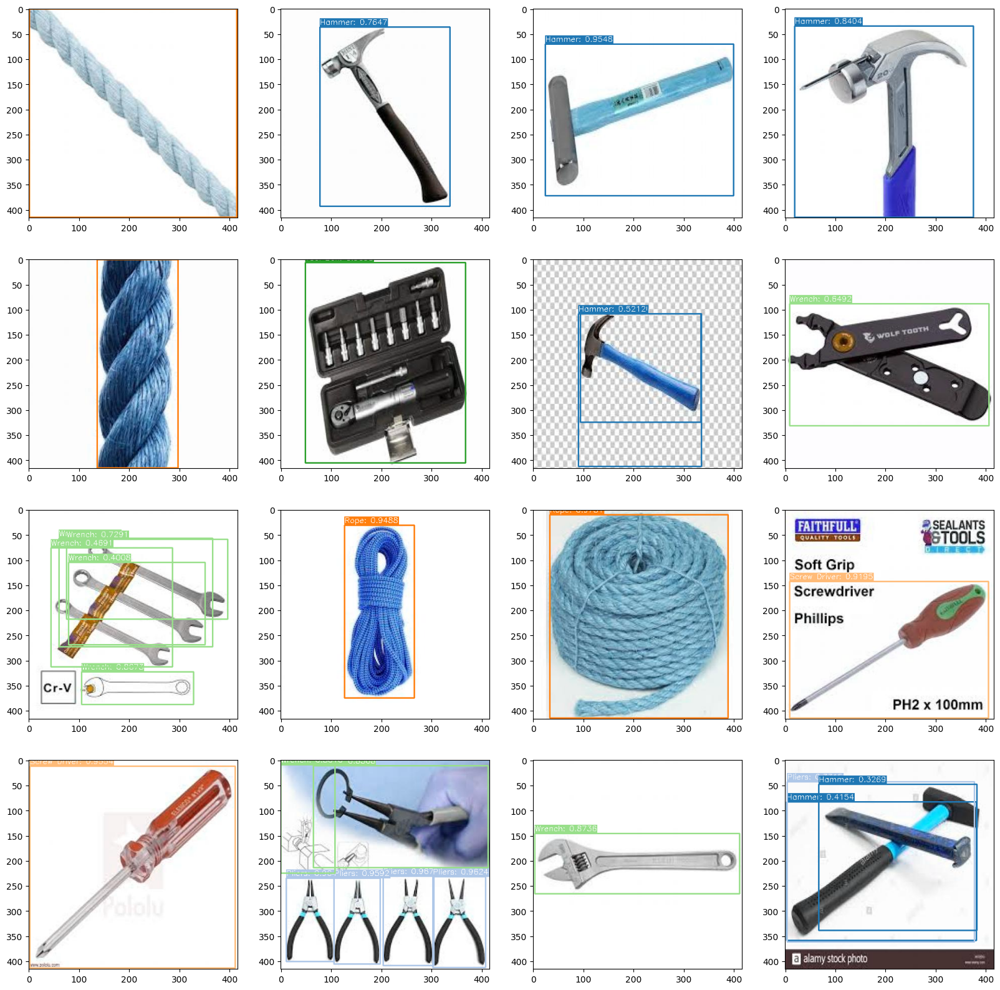

In [40]:
fig, ax = plt.subplots(4, 4, figsize=(20, 20))
# id and name of each class that can be identified by the model
class_names = model.names
# assign colors to each class
class_colors = choose_colors(class_names)
for i in range(16):
    # get the first image from the test dataset
    img = deepcopy(results[i].orig_img)
    _ = ax[i % 4][i // 4].imshow(results[i].orig_img)
    # draw the bounding boxes
    new_img = draw_bounding_box(
        img,
        np.array(results[i].boxes.xyxy.cpu(), dtype="int"),
        np.array(results[i].boxes.cls.cpu(), dtype="int"),
        np.array(results[i].boxes.conf.cpu()),
        class_names,
        class_colors,
    )
    _ = ax[i % 4][i // 4].imshow(new_img)

## Part 2 - Using Detectron 2

### Prepare the dataset

In [41]:
# register the training dataset
train_path = os.path.abspath(os.path.join("aiHub.v1i.coco", "train"))
register_coco_instances(
    "custom_dataset_train",
    {},
    os.path.join(train_path, "_annotations.coco.json"),
    train_path,
)

In [42]:
# register the validation dataset
valid_path = os.path.abspath(os.path.join("aiHub.v1i.coco", "valid"))
register_coco_instances(
    "custom_dataset_valid",
    {},
    os.path.join(valid_path, "_annotations.coco.json"),
    valid_path,
)

In [43]:
# register the test dataset
test_path = os.path.abspath(os.path.join("aiHub.v1i.coco", "test"))
register_coco_instances(
    "custom_dataset_test",
    {},
    os.path.join(test_path, "_annotations.coco.json"),
    test_path,
)

WARNING [09/30 06:58:54 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[09/30 06:58:54 d2.data.datasets.coco]: Loaded 534 images in COCO format from /content/aiHub.v1i.coco/train/_annotations.coco.json


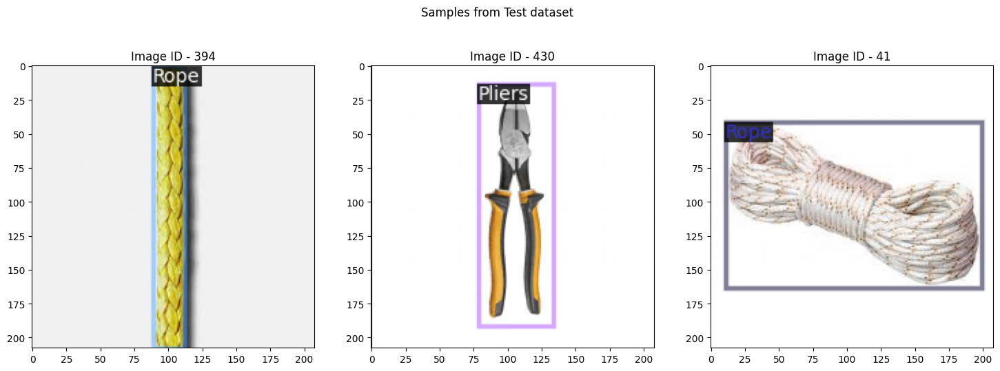

In [44]:
# show samples from the training dataset
dataset_train_metadata = MetadataCatalog.get("custom_dataset_train")
dataset_train_dict = DatasetCatalog.get("custom_dataset_train")
fig, ax = plt.subplots(1, 3, figsize=(18, 6))
fig.suptitle("Samples from Test dataset")
for idx, d in enumerate(random.sample(dataset_train_dict, 3)):
    # read the image
    img = cv2.imread(d["file_name"])
    # convert the image from BGR to RGB
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    # prepare the visualizer
    visualizer = Visualizer(img, metadata=dataset_train_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    # plot the image
    _ = ax[idx].imshow(vis.get_image())
    _ = ax[idx].set_title(f"Image ID - {d['image_id']}")

### Train the model

In [45]:
# prepare training configuration
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("custom_dataset_train", )
cfg.DATASETS.TEST = ("custom_dataset_valid", )
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml")
cfg.MODEL.DEVICE = DEVICE.type
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00025
cfg.SOLVER.MAX_ITER = 1000
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128
cfg.MODEL.ROI_HEADS.NUM_CLASSES = len(dataset_train_metadata.thing_classes)
cfg.INPUT.MIN_SIZE_TRAIN = 416
cfg.INPUT.MAX_SIZE_TRAIN = 416
cfg.INPUT.MIN_SIZE_TEST = 416
cfg.INPUT.MAX_SIZE_TEST = 416

In [46]:
# prepare the trainer class for detectron2
class CocoTrainer(DefaultTrainer):
    @classmethod
    def build_evaluator(cls, cfg, dataset_name, output_folder=None):
        if output_folder is None:
            os.makedirs("coco_eval", exist_ok=True)
            output_folder = "coco_eval"
        return COCOEvaluator(dataset_name, cfg, False, output_folder)

In [47]:
# train the model and store the results in cfg.OUTPUT_DIR
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = CocoTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[09/30 06:58:57 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_280758.pkl: 167MB [00:01, 145MB/s]                           
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}


[09/30 06:58:58 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.10/dist-packages/torch/functional.py:513: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3609.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:769: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  return Variable._execu

[09/30 06:59:02 d2.utils.events]:  eta: 0:02:35  iter: 19  total_loss: 2.734  loss_cls: 2.049  loss_box_reg: 0.6428  loss_rpn_cls: 0.01143  loss_rpn_loc: 0.01107    time: 0.1592  last_time: 0.1629  data_time: 0.0143  last_data_time: 0.0053   lr: 4.9953e-06  max_mem: 5450M


/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:769: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass
/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:769: UserWarning: roi_align_backward_kernel does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You ca

[09/30 06:59:05 d2.utils.events]:  eta: 0:02:32  iter: 39  total_loss: 2.536  loss_cls: 1.852  loss_box_reg: 0.596  loss_rpn_cls: 0.01331  loss_rpn_loc: 0.006341    time: 0.1595  last_time: 0.1561  data_time: 0.0057  last_data_time: 0.0046   lr: 9.9902e-06  max_mem: 5450M


/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:769: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass
/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:769: UserWarning: roi_align_backward_kernel does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You ca

[09/30 06:59:08 d2.utils.events]:  eta: 0:02:31  iter: 59  total_loss: 2.262  loss_cls: 1.551  loss_box_reg: 0.6968  loss_rpn_cls: 0.01427  loss_rpn_loc: 0.006711    time: 0.1608  last_time: 0.1689  data_time: 0.0064  last_data_time: 0.0046   lr: 1.4985e-05  max_mem: 5450M


/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:769: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass
/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:769: UserWarning: roi_align_backward_kernel does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You ca

[09/30 06:59:12 d2.utils.events]:  eta: 0:02:29  iter: 79  total_loss: 1.761  loss_cls: 1.144  loss_box_reg: 0.6095  loss_rpn_cls: 0.007525  loss_rpn_loc: 0.003961    time: 0.1653  last_time: 0.1755  data_time: 0.0118  last_data_time: 0.0143   lr: 1.998e-05  max_mem: 5450M


/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:769: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass
/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:769: UserWarning: roi_align_backward_kernel does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You ca

[09/30 06:59:16 d2.utils.events]:  eta: 0:02:26  iter: 99  total_loss: 1.344  loss_cls: 0.7802  loss_box_reg: 0.5752  loss_rpn_cls: 0.004626  loss_rpn_loc: 0.00543    time: 0.1673  last_time: 0.1618  data_time: 0.0118  last_data_time: 0.0110   lr: 2.4975e-05  max_mem: 5450M


/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:769: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass
/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:769: UserWarning: roi_align_backward_kernel does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You ca

[09/30 06:59:19 d2.utils.events]:  eta: 0:02:23  iter: 119  total_loss: 1.327  loss_cls: 0.6302  loss_box_reg: 0.6736  loss_rpn_cls: 0.003662  loss_rpn_loc: 0.004859    time: 0.1661  last_time: 0.1614  data_time: 0.0066  last_data_time: 0.0053   lr: 2.997e-05  max_mem: 5450M


/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:769: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass
/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:769: UserWarning: roi_align_backward_kernel does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You ca

[09/30 06:59:22 d2.utils.events]:  eta: 0:02:19  iter: 139  total_loss: 1.131  loss_cls: 0.5521  loss_box_reg: 0.5446  loss_rpn_cls: 0.006486  loss_rpn_loc: 0.007917    time: 0.1655  last_time: 0.1624  data_time: 0.0071  last_data_time: 0.0052   lr: 3.4965e-05  max_mem: 5450M


/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:769: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass
/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:769: UserWarning: roi_align_backward_kernel does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You ca

[09/30 06:59:25 d2.utils.events]:  eta: 0:02:16  iter: 159  total_loss: 1.155  loss_cls: 0.5041  loss_box_reg: 0.5809  loss_rpn_cls: 0.002872  loss_rpn_loc: 0.004185    time: 0.1659  last_time: 0.1827  data_time: 0.0106  last_data_time: 0.0231   lr: 3.996e-05  max_mem: 5450M


/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:769: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass
/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:769: UserWarning: roi_align_backward_kernel does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You ca

[09/30 06:59:29 d2.utils.events]:  eta: 0:02:14  iter: 179  total_loss: 1.225  loss_cls: 0.5434  loss_box_reg: 0.6669  loss_rpn_cls: 0.004929  loss_rpn_loc: 0.004833    time: 0.1685  last_time: 0.1757  data_time: 0.0191  last_data_time: 0.0053   lr: 4.4955e-05  max_mem: 5450M


/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:769: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass
/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:769: UserWarning: roi_align_backward_kernel does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You ca

[09/30 06:59:33 d2.utils.events]:  eta: 0:02:11  iter: 199  total_loss: 1.359  loss_cls: 0.5556  loss_box_reg: 0.7345  loss_rpn_cls: 0.00508  loss_rpn_loc: 0.007873    time: 0.1691  last_time: 0.1600  data_time: 0.0098  last_data_time: 0.0047   lr: 4.995e-05  max_mem: 5450M


/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:769: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass
/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:769: UserWarning: roi_align_backward_kernel does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You ca

[09/30 06:59:36 d2.utils.events]:  eta: 0:02:07  iter: 219  total_loss: 1.105  loss_cls: 0.4528  loss_box_reg: 0.6445  loss_rpn_cls: 0.002702  loss_rpn_loc: 0.00436    time: 0.1685  last_time: 0.1612  data_time: 0.0066  last_data_time: 0.0044   lr: 5.4945e-05  max_mem: 5450M


/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:769: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass
/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:769: UserWarning: roi_align_backward_kernel does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You ca

[09/30 06:59:39 d2.utils.events]:  eta: 0:02:04  iter: 239  total_loss: 1.119  loss_cls: 0.4775  loss_box_reg: 0.6255  loss_rpn_cls: 0.002572  loss_rpn_loc: 0.006032    time: 0.1680  last_time: 0.1605  data_time: 0.0068  last_data_time: 0.0041   lr: 5.994e-05  max_mem: 5450M


/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:769: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass
/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:769: UserWarning: roi_align_backward_kernel does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You ca

[09/30 06:59:43 d2.utils.events]:  eta: 0:02:00  iter: 259  total_loss: 0.9573  loss_cls: 0.3788  loss_box_reg: 0.575  loss_rpn_cls: 0.00112  loss_rpn_loc: 0.003491    time: 0.1682  last_time: 0.1888  data_time: 0.0124  last_data_time: 0.0201   lr: 6.4935e-05  max_mem: 5450M


/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:769: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass
/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:769: UserWarning: roi_align_backward_kernel does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You ca

[09/30 06:59:46 d2.utils.events]:  eta: 0:01:58  iter: 279  total_loss: 0.9885  loss_cls: 0.3982  loss_box_reg: 0.5732  loss_rpn_cls: 0.001305  loss_rpn_loc: 0.004646    time: 0.1694  last_time: 0.1789  data_time: 0.0164  last_data_time: 0.0146   lr: 6.993e-05  max_mem: 5450M


/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:769: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass
/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:769: UserWarning: roi_align_backward_kernel does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You ca

[09/30 06:59:50 d2.utils.events]:  eta: 0:01:54  iter: 299  total_loss: 0.9773  loss_cls: 0.3846  loss_box_reg: 0.588  loss_rpn_cls: 0.002617  loss_rpn_loc: 0.00568    time: 0.1694  last_time: 0.1629  data_time: 0.0102  last_data_time: 0.0112   lr: 7.4925e-05  max_mem: 5450M


/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:769: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass
/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:769: UserWarning: roi_align_backward_kernel does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You ca

[09/30 06:59:53 d2.utils.events]:  eta: 0:01:51  iter: 319  total_loss: 1.011  loss_cls: 0.4072  loss_box_reg: 0.6113  loss_rpn_cls: 0.001729  loss_rpn_loc: 0.004116    time: 0.1691  last_time: 0.1589  data_time: 0.0104  last_data_time: 0.0045   lr: 7.992e-05  max_mem: 5450M


/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:769: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass
/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:769: UserWarning: roi_align_backward_kernel does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You ca

[09/30 06:59:56 d2.utils.events]:  eta: 0:01:47  iter: 339  total_loss: 0.9645  loss_cls: 0.3843  loss_box_reg: 0.5683  loss_rpn_cls: 0.001017  loss_rpn_loc: 0.004285    time: 0.1687  last_time: 0.1811  data_time: 0.0082  last_data_time: 0.0099   lr: 8.4915e-05  max_mem: 5450M


/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:769: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass
/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:769: UserWarning: roi_align_backward_kernel does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You ca

[09/30 07:00:00 d2.utils.events]:  eta: 0:01:44  iter: 359  total_loss: 0.9799  loss_cls: 0.3663  loss_box_reg: 0.6128  loss_rpn_cls: 0.001834  loss_rpn_loc: 0.004045    time: 0.1690  last_time: 0.1781  data_time: 0.0120  last_data_time: 0.0120   lr: 8.991e-05  max_mem: 5450M


/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:769: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass
/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:769: UserWarning: roi_align_backward_kernel does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You ca

[09/30 07:00:03 d2.utils.events]:  eta: 0:01:41  iter: 379  total_loss: 0.9837  loss_cls: 0.3749  loss_box_reg: 0.5938  loss_rpn_cls: 0.005953  loss_rpn_loc: 0.006767    time: 0.1696  last_time: 0.1768  data_time: 0.0153  last_data_time: 0.0167   lr: 9.4905e-05  max_mem: 5450M


/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:769: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass
/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:769: UserWarning: roi_align_backward_kernel does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You ca

[09/30 07:00:07 d2.utils.events]:  eta: 0:01:38  iter: 399  total_loss: 0.9345  loss_cls: 0.3546  loss_box_reg: 0.5815  loss_rpn_cls: 0.0005633  loss_rpn_loc: 0.004795    time: 0.1699  last_time: 0.1724  data_time: 0.0112  last_data_time: 0.0057   lr: 9.99e-05  max_mem: 5450M


/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:769: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass
/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:769: UserWarning: roi_align_backward_kernel does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You ca

[09/30 07:00:10 d2.utils.events]:  eta: 0:01:35  iter: 419  total_loss: 0.9281  loss_cls: 0.3566  loss_box_reg: 0.5671  loss_rpn_cls: 0.001833  loss_rpn_loc: 0.005164    time: 0.1695  last_time: 0.1592  data_time: 0.0085  last_data_time: 0.0049   lr: 0.0001049  max_mem: 5450M


/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:769: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass
/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:769: UserWarning: roi_align_backward_kernel does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You ca

[09/30 07:00:13 d2.utils.events]:  eta: 0:01:31  iter: 439  total_loss: 0.9127  loss_cls: 0.3319  loss_box_reg: 0.5652  loss_rpn_cls: 0.0007669  loss_rpn_loc: 0.005342    time: 0.1691  last_time: 0.1647  data_time: 0.0073  last_data_time: 0.0047   lr: 0.00010989  max_mem: 5450M


/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:769: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass
/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:769: UserWarning: roi_align_backward_kernel does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You ca

[09/30 07:00:17 d2.utils.events]:  eta: 0:01:28  iter: 459  total_loss: 0.9519  loss_cls: 0.342  loss_box_reg: 0.5795  loss_rpn_cls: 0.001366  loss_rpn_loc: 0.004944    time: 0.1690  last_time: 0.1900  data_time: 0.0076  last_data_time: 0.0044   lr: 0.00011489  max_mem: 5450M


/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:769: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass
/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:769: UserWarning: roi_align_backward_kernel does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You ca

[09/30 07:00:20 d2.utils.events]:  eta: 0:01:25  iter: 479  total_loss: 0.9067  loss_cls: 0.3363  loss_box_reg: 0.5549  loss_rpn_cls: 0.002596  loss_rpn_loc: 0.006687    time: 0.1695  last_time: 0.1823  data_time: 0.0104  last_data_time: 0.0060   lr: 0.00011988  max_mem: 5450M


/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:769: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass
/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:769: UserWarning: roi_align_backward_kernel does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You ca

[09/30 07:00:24 d2.utils.events]:  eta: 0:01:22  iter: 499  total_loss: 0.8983  loss_cls: 0.3052  loss_box_reg: 0.5573  loss_rpn_cls: 0.0007312  loss_rpn_loc: 0.007768    time: 0.1696  last_time: 0.1592  data_time: 0.0092  last_data_time: 0.0046   lr: 0.00012488  max_mem: 5450M


/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:769: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass
/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:769: UserWarning: roi_align_backward_kernel does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You ca

[09/30 07:00:27 d2.utils.events]:  eta: 0:01:18  iter: 519  total_loss: 0.9306  loss_cls: 0.3254  loss_box_reg: 0.5575  loss_rpn_cls: 0.002609  loss_rpn_loc: 0.00784    time: 0.1692  last_time: 0.1556  data_time: 0.0060  last_data_time: 0.0047   lr: 0.00012987  max_mem: 5450M


/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:769: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass
/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:769: UserWarning: roi_align_backward_kernel does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You ca

[09/30 07:00:30 d2.utils.events]:  eta: 0:01:15  iter: 539  total_loss: 0.7895  loss_cls: 0.2625  loss_box_reg: 0.5102  loss_rpn_cls: 0.0005026  loss_rpn_loc: 0.005576    time: 0.1689  last_time: 0.1574  data_time: 0.0080  last_data_time: 0.0043   lr: 0.00013487  max_mem: 5450M


/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:769: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass
/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:769: UserWarning: roi_align_backward_kernel does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You ca

[09/30 07:00:34 d2.utils.events]:  eta: 0:01:11  iter: 559  total_loss: 0.8329  loss_cls: 0.3317  loss_box_reg: 0.4946  loss_rpn_cls: 0.0002282  loss_rpn_loc: 0.008068    time: 0.1689  last_time: 0.1732  data_time: 0.0082  last_data_time: 0.0046   lr: 0.00013986  max_mem: 5450M


/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:769: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass
/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:769: UserWarning: roi_align_backward_kernel does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You ca

[09/30 07:00:37 d2.utils.events]:  eta: 0:01:08  iter: 579  total_loss: 0.7693  loss_cls: 0.2734  loss_box_reg: 0.4723  loss_rpn_cls: 0.001645  loss_rpn_loc: 0.01245    time: 0.1695  last_time: 0.1870  data_time: 0.0173  last_data_time: 0.0175   lr: 0.00014486  max_mem: 5450M


/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:769: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass
/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:769: UserWarning: roi_align_backward_kernel does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You ca

[09/30 07:00:41 d2.utils.events]:  eta: 0:01:05  iter: 599  total_loss: 0.6947  loss_cls: 0.2655  loss_box_reg: 0.4246  loss_rpn_cls: 0.0006937  loss_rpn_loc: 0.01023    time: 0.1694  last_time: 0.1603  data_time: 0.0088  last_data_time: 0.0049   lr: 0.00014985  max_mem: 5450M


/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:769: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass
/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:769: UserWarning: roi_align_backward_kernel does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You ca

[09/30 07:00:44 d2.utils.events]:  eta: 0:01:02  iter: 619  total_loss: 0.6332  loss_cls: 0.257  loss_box_reg: 0.4366  loss_rpn_cls: 0.002968  loss_rpn_loc: 0.007545    time: 0.1692  last_time: 0.1591  data_time: 0.0081  last_data_time: 0.0045   lr: 0.00015485  max_mem: 5450M


/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:769: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass
/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:769: UserWarning: roi_align_backward_kernel does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You ca

[09/30 07:00:47 d2.utils.events]:  eta: 0:00:58  iter: 639  total_loss: 0.557  loss_cls: 0.2149  loss_box_reg: 0.3275  loss_rpn_cls: 0.000754  loss_rpn_loc: 0.0116    time: 0.1690  last_time: 0.1639  data_time: 0.0095  last_data_time: 0.0112   lr: 0.00015984  max_mem: 5450M


/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:769: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass
/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:769: UserWarning: roi_align_backward_kernel does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You ca

[09/30 07:00:51 d2.utils.events]:  eta: 0:00:55  iter: 659  total_loss: 0.4562  loss_cls: 0.1428  loss_box_reg: 0.2872  loss_rpn_cls: 0.0001912  loss_rpn_loc: 0.007995    time: 0.1692  last_time: 0.1919  data_time: 0.0095  last_data_time: 0.0242   lr: 0.00016484  max_mem: 5450M


/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:769: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass
/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:769: UserWarning: roi_align_backward_kernel does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You ca

[09/30 07:00:55 d2.utils.events]:  eta: 0:00:52  iter: 679  total_loss: 0.5606  loss_cls: 0.2259  loss_box_reg: 0.3193  loss_rpn_cls: 0.002518  loss_rpn_loc: 0.008505    time: 0.1697  last_time: 0.1623  data_time: 0.0162  last_data_time: 0.0107   lr: 0.00016983  max_mem: 5450M


/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:769: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass
/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:769: UserWarning: roi_align_backward_kernel does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You ca

[09/30 07:00:58 d2.utils.events]:  eta: 0:00:49  iter: 699  total_loss: 0.5004  loss_cls: 0.2061  loss_box_reg: 0.2775  loss_rpn_cls: 0.0008511  loss_rpn_loc: 0.005328    time: 0.1695  last_time: 0.1621  data_time: 0.0078  last_data_time: 0.0047   lr: 0.00017483  max_mem: 5450M


/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:769: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass
/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:769: UserWarning: roi_align_backward_kernel does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You ca

[09/30 07:01:01 d2.utils.events]:  eta: 0:00:45  iter: 719  total_loss: 0.6982  loss_cls: 0.295  loss_box_reg: 0.3536  loss_rpn_cls: 0.0006221  loss_rpn_loc: 0.004612    time: 0.1692  last_time: 0.1596  data_time: 0.0085  last_data_time: 0.0049   lr: 0.00017982  max_mem: 5450M


/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:769: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass
/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:769: UserWarning: roi_align_backward_kernel does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You ca

[09/30 07:01:04 d2.utils.events]:  eta: 0:00:42  iter: 739  total_loss: 0.4456  loss_cls: 0.1796  loss_box_reg: 0.2623  loss_rpn_cls: 0.0002624  loss_rpn_loc: 0.00691    time: 0.1690  last_time: 0.1637  data_time: 0.0064  last_data_time: 0.0047   lr: 0.00018482  max_mem: 5450M


/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:769: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass
/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:769: UserWarning: roi_align_backward_kernel does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You ca

[09/30 07:01:08 d2.utils.events]:  eta: 0:00:39  iter: 759  total_loss: 0.4987  loss_cls: 0.1955  loss_box_reg: 0.3152  loss_rpn_cls: 0.002181  loss_rpn_loc: 0.005081    time: 0.1694  last_time: 0.1849  data_time: 0.0191  last_data_time: 0.0248   lr: 0.00018981  max_mem: 5450M


/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:769: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass
/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:769: UserWarning: roi_align_backward_kernel does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You ca

[09/30 07:01:12 d2.utils.events]:  eta: 0:00:36  iter: 779  total_loss: 0.3981  loss_cls: 0.1584  loss_box_reg: 0.2329  loss_rpn_cls: 0.0003878  loss_rpn_loc: 0.005244    time: 0.1697  last_time: 0.1629  data_time: 0.0160  last_data_time: 0.0138   lr: 0.00019481  max_mem: 5450M


/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:769: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass
/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:769: UserWarning: roi_align_backward_kernel does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You ca

[09/30 07:01:15 d2.utils.events]:  eta: 0:00:32  iter: 799  total_loss: 0.4271  loss_cls: 0.1241  loss_box_reg: 0.2183  loss_rpn_cls: 0.0009311  loss_rpn_loc: 0.006872    time: 0.1695  last_time: 0.1673  data_time: 0.0082  last_data_time: 0.0048   lr: 0.0001998  max_mem: 5450M


/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:769: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass
/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:769: UserWarning: roi_align_backward_kernel does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You ca

[09/30 07:01:18 d2.utils.events]:  eta: 0:00:29  iter: 819  total_loss: 0.4049  loss_cls: 0.1873  loss_box_reg: 0.2093  loss_rpn_cls: 0.0002774  loss_rpn_loc: 0.00551    time: 0.1693  last_time: 0.1589  data_time: 0.0081  last_data_time: 0.0050   lr: 0.0002048  max_mem: 5450M


/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:769: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass
/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:769: UserWarning: roi_align_backward_kernel does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You ca

[09/30 07:01:21 d2.utils.events]:  eta: 0:00:26  iter: 839  total_loss: 0.4299  loss_cls: 0.1889  loss_box_reg: 0.1988  loss_rpn_cls: 0.0002504  loss_rpn_loc: 0.005049    time: 0.1692  last_time: 0.1793  data_time: 0.0089  last_data_time: 0.0183   lr: 0.00020979  max_mem: 5450M


/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:769: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass
/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:769: UserWarning: roi_align_backward_kernel does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You ca

[09/30 07:01:25 d2.utils.events]:  eta: 0:00:22  iter: 859  total_loss: 0.382  loss_cls: 0.1656  loss_box_reg: 0.2251  loss_rpn_cls: 0.0001211  loss_rpn_loc: 0.00887    time: 0.1695  last_time: 0.1812  data_time: 0.0126  last_data_time: 0.0098   lr: 0.00021479  max_mem: 5450M


/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:769: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass
/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:769: UserWarning: roi_align_backward_kernel does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You ca

[09/30 07:01:29 d2.utils.events]:  eta: 0:00:19  iter: 879  total_loss: 0.3919  loss_cls: 0.1256  loss_box_reg: 0.2103  loss_rpn_cls: 0.0007537  loss_rpn_loc: 0.003572    time: 0.1698  last_time: 0.2097  data_time: 0.0134  last_data_time: 0.0120   lr: 0.00021978  max_mem: 5450M


/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:769: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass
/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:769: UserWarning: roi_align_backward_kernel does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You ca

[09/30 07:01:32 d2.utils.events]:  eta: 0:00:16  iter: 899  total_loss: 0.3367  loss_cls: 0.13  loss_box_reg: 0.2056  loss_rpn_cls: 0.0008139  loss_rpn_loc: 0.01582    time: 0.1696  last_time: 0.1578  data_time: 0.0077  last_data_time: 0.0060   lr: 0.00022478  max_mem: 5450M


/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:769: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass
/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:769: UserWarning: roi_align_backward_kernel does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You ca

[09/30 07:01:35 d2.utils.events]:  eta: 0:00:13  iter: 919  total_loss: 0.315  loss_cls: 0.1101  loss_box_reg: 0.1813  loss_rpn_cls: 0.0002564  loss_rpn_loc: 0.004751    time: 0.1694  last_time: 0.1577  data_time: 0.0075  last_data_time: 0.0045   lr: 0.00022977  max_mem: 5450M


/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:769: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass
/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:769: UserWarning: roi_align_backward_kernel does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You ca

[09/30 07:01:38 d2.utils.events]:  eta: 0:00:09  iter: 939  total_loss: 0.3025  loss_cls: 0.1158  loss_box_reg: 0.1887  loss_rpn_cls: 0.0001407  loss_rpn_loc: 0.004265    time: 0.1692  last_time: 0.1664  data_time: 0.0077  last_data_time: 0.0117   lr: 0.00023477  max_mem: 5450M


/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:769: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass
/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:769: UserWarning: roi_align_backward_kernel does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You ca

[09/30 07:01:42 d2.utils.events]:  eta: 0:00:06  iter: 959  total_loss: 0.2808  loss_cls: 0.1088  loss_box_reg: 0.1704  loss_rpn_cls: 0.0001501  loss_rpn_loc: 0.003393    time: 0.1694  last_time: 0.1752  data_time: 0.0147  last_data_time: 0.0123   lr: 0.00023976  max_mem: 5450M


/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:769: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass
/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:769: UserWarning: roi_align_backward_kernel does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You ca

[09/30 07:01:46 d2.utils.events]:  eta: 0:00:03  iter: 979  total_loss: 0.3153  loss_cls: 0.1288  loss_box_reg: 0.1616  loss_rpn_cls: 4.64e-05  loss_rpn_loc: 0.004034    time: 0.1697  last_time: 0.1835  data_time: 0.0179  last_data_time: 0.0190   lr: 0.00024476  max_mem: 5450M


/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:769: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:185.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass
/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:769: UserWarning: roi_align_backward_kernel does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You ca

[09/30 07:01:50 d2.utils.events]:  eta: 0:00:00  iter: 999  total_loss: 0.3939  loss_cls: 0.1152  loss_box_reg: 0.1931  loss_rpn_cls: 9.767e-05  loss_rpn_loc: 0.005075    time: 0.1696  last_time: 0.1722  data_time: 0.0103  last_data_time: 0.0194   lr: 0.00024975  max_mem: 5450M
[09/30 07:01:51 d2.engine.hooks]: Overall training speed: 998 iterations in 0:02:49 (0.1696 s / it)
[09/30 07:01:51 d2.engine.hooks]: Total training time: 0:02:51 (0:00:02 on hooks)
WARNING [09/30 07:01:51 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[09/30 07:01:51 d2.data.datasets.coco]: Loaded 51 images in COCO format from /content/aiHub.v1i.coco/valid/_annotations.coco.json
[09/30 07:01:51 d2.data.build]: Distribution of instances among all 7 categories:
|  category  | #instances   |   category   | #instances   |  category  | #instances   |
|:----------:|:-------------|:------------:|:-------------|:----------:|:-------------|
|   aiHub    

In [48]:
# create a predictor using final model weights
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7
predictor = DefaultPredictor(cfg)

[09/30 07:01:54 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...


In [49]:
# create an evaluator for the validation dataset
evaluator = COCOEvaluator("custom_dataset_valid", cfg, False, output_dir=os.path.join(cfg.OUTPUT_DIR, "valid"))
# create a loader for validations dataset
valid_loader = build_detection_test_loader(cfg, "custom_dataset_valid")
# perform inference on the validation dataset
inference_on_dataset(trainer.model, valid_loader, evaluator)

WARNING [09/30 07:01:54 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
WARNING [09/30 07:01:54 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[09/30 07:01:54 d2.data.datasets.coco]: Loaded 51 images in COCO format from /content/aiHub.v1i.coco/valid/_annotations.coco.json
[09/30 07:01:54 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(416, 416), max_size=416, sample_style='choice')]
[09/30 07:01:54 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[09/30 07:01:54 d2.data.common]: Serializing 51 elements to byte tensors and concatenating them all ...
[09/30 07:01:54 d2.data.common]: Serialized dataset takes 0.01 MiB
[09/30 07:01:54 d2.evaluation.evaluator]: Start inference on 51 batches
[09/30 07:01:56 d2.eval

OrderedDict([('bbox',
              {'AP': 45.44768302112462,
               'AP50': 65.36014462386701,
               'AP75': 54.0077249033106,
               'APs': nan,
               'APm': 18.015676567656765,
               'APl': 47.301586581749945,
               'AP-aiHub': nan,
               'AP-Hammer': 34.00740172167232,
               'AP-Pliers': 32.16201620162016,
               'AP-Rope': 66.9017830354464,
               'AP-Screw Driver': 8.540709715914195,
               'AP-Tool Box': 71.7133427628477,
               'AP-Wrench': 59.360844689246896})])

The results from validation dataset can be summarized as below -

- the AP on validation dataset is 0.4413, which increases to 0.63 when the theshold is set to 0.5.
- the mAP is still quite low on the validation set at 0.2795, indicating the model might have overfit.
- the model is quite good at identifying tool box and rope, with an Average precision of 0.7867 and 0.6349, respectively.
- the model is quite bad at identifiying screw driver, with an Average Precision of 0.0674.

WARNING [09/30 07:01:57 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[09/30 07:01:57 d2.data.datasets.coco]: Loaded 51 images in COCO format from /content/aiHub.v1i.coco/valid/_annotations.coco.json


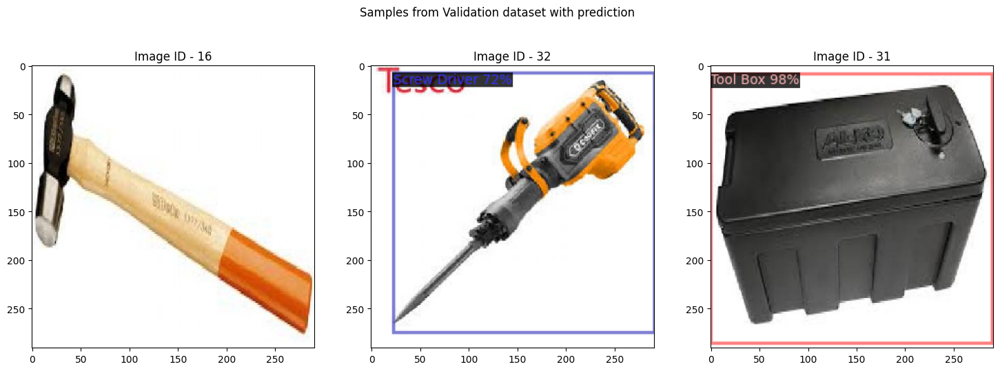

In [50]:
# show samples from the validation dataset
dataset_valid_metadata = MetadataCatalog.get("custom_dataset_valid")
dataset_valid_dict = DatasetCatalog.get("custom_dataset_valid")
fig, ax = plt.subplots(1, 3, figsize=(18, 6))
fig.suptitle("Samples from Validation dataset with prediction")
for idx, d in enumerate(random.sample(dataset_valid_dict, 3)):
    # read the image
    img = cv2.imread(d["file_name"])
    # get the predictions from model
    outputs = predictor(img)
    # convert the image from BGR to RGB
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    # prepare the visualizer
    visualizer = Visualizer(img, metadata=dataset_valid_metadata, scale=0.7)
    vis = visualizer.draw_instance_predictions(outputs["instances"].to("cpu"))
    # plot the image
    _ = ax[idx].imshow(vis.get_image())
    _ = ax[idx].set_title(f"Image ID - {d['image_id']}")

Based on the above samples, we can see that the model could not identify any object in the first random image from validation set. Its a hammer, but the model didn't predict any object in the image.

In [51]:
# create an evaluator for the test dataset
evaluator = COCOEvaluator("custom_dataset_test", cfg, False, output_dir=os.path.join(cfg.OUTPUT_DIR, "test"))
# create a loader for test dataset
test_loader = build_detection_test_loader(cfg, "custom_dataset_test")
# perform inference on the test dataset
inference_on_dataset(trainer.model, test_loader, evaluator)

WARNING [09/30 07:01:58 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
WARNING [09/30 07:01:58 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[09/30 07:01:58 d2.data.datasets.coco]: Loaded 26 images in COCO format from /content/aiHub.v1i.coco/test/_annotations.coco.json
[09/30 07:01:58 d2.data.build]: Distribution of instances among all 7 categories:
|  category  | #instances   |   category   | #instances   |  category  | #instances   |
|:----------:|:-------------|:------------:|:-------------|:----------:|:-------------|
|   aiHub    | 0            |    Hammer    | 6            |   Pliers   | 4            |
|    Rope    | 5            | Screw Driver | 12           |  Tool Box  | 4            |
|   Wrench   | 14           |              |              |            |              |
|   total    | 45           |            

OrderedDict([('bbox',
              {'AP': 63.71152072167058,
               'AP50': 83.8679936416936,
               'AP75': 72.75248591439623,
               'APs': nan,
               'APm': 43.23426026813208,
               'APl': 65.81512058409749,
               'AP-aiHub': nan,
               'AP-Hammer': 71.7991513437058,
               'AP-Pliers': 82.57425742574257,
               'AP-Rope': 88.45544554455446,
               'AP-Screw Driver': 36.28783602262129,
               'AP-Tool Box': 66.02310231023102,
               'AP-Wrench': 37.12933168316832})])

Compared to the validation set, the model performed really well on the test dataset -

- the AP and AP50 are much better compard to the validation dataset, at 0.61 and 0.83 respectively.
- the mAP on test set is much better at 0.4432 compared to the mAP on the validation set.
- Both screw driver and wrench have an AP much lower than the overall AP, indiciating the model is having a hard time detecting Screw Driver and Wrench in the test dataset.
- Rope and Tool Box again have the highest AP compared to the other classes on the test dataset.

WARNING [09/30 07:02:00 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[09/30 07:02:00 d2.data.datasets.coco]: Loaded 26 images in COCO format from /content/aiHub.v1i.coco/test/_annotations.coco.json


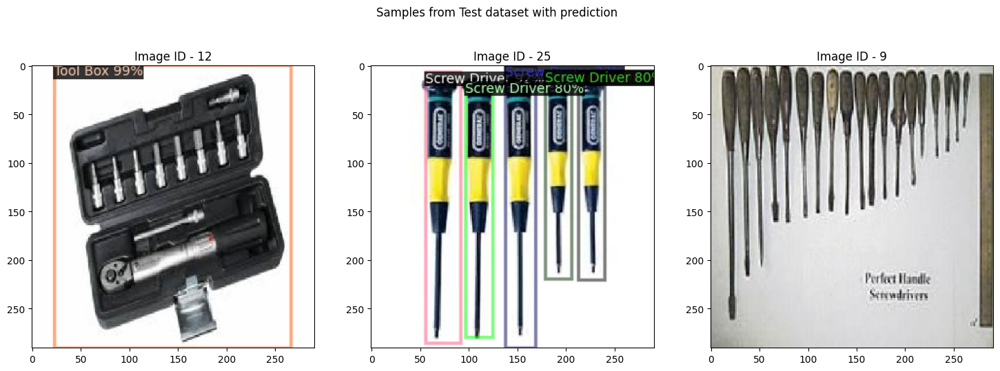

In [52]:
# show samples from the test dataset
dataset_test_metadata = MetadataCatalog.get("custom_dataset_test")
dataset_test_dict = DatasetCatalog.get("custom_dataset_test")
fig, ax = plt.subplots(1, 3, figsize=(18, 6))
fig.suptitle("Samples from Test dataset with prediction")
for idx, d in enumerate(random.sample(dataset_test_dict, 3)):
    # read the image
    img = cv2.imread(d["file_name"])
    # get the predictions from model
    outputs = predictor(img)
    # convert the image from BGR to RGB
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    # prepare the visualizer
    visualizer = Visualizer(img, metadata=dataset_test_metadata, scale=0.7)
    vis = visualizer.draw_instance_predictions(outputs["instances"].to("cpu"))
    # plot the image
    _ = ax[idx].imshow(vis.get_image())
    _ = ax[idx].set_title(f"Image ID - {d['image_id']}")

We can see that the model could not identify screw drivers in the third random image of the test dataset. This is evidence for the earlier observation that the model is not good at identifying screw drivers in the test dataset, with an average precision of 0.3725.

In [53]:
import locale
locale.getpreferredencoding = lambda: "UTF-8"

In [54]:
!zip -r runs.zip runs
!zip -r output.zip output
!zip -r coco_eval.zip coco_eval

  adding: runs/ (stored 0%)
  adding: runs/detect/ (stored 0%)
  adding: runs/detect/val/ (stored 0%)
  adding: runs/detect/val/val_batch0_pred.jpg (deflated 23%)
  adding: runs/detect/val/confusion_matrix.png (deflated 29%)
  adding: runs/detect/val/F1_curve.png (deflated 7%)
  adding: runs/detect/val/R_curve.png (deflated 10%)
  adding: runs/detect/val/P_curve.png (deflated 7%)
  adding: runs/detect/val/confusion_matrix_normalized.png (deflated 21%)
  adding: runs/detect/val/val_batch1_labels.jpg (deflated 22%)
  adding: runs/detect/val/PR_curve.png (deflated 13%)
  adding: runs/detect/val/val_batch2_pred.jpg (deflated 27%)
  adding: runs/detect/val/val_batch0_labels.jpg (deflated 23%)
  adding: runs/detect/val/val_batch2_labels.jpg (deflated 29%)
  adding: runs/detect/val/val_batch1_pred.jpg (deflated 23%)
  adding: runs/detect/train/ (stored 0%)
  adding: runs/detect/train/val_batch0_pred.jpg (deflated 23%)
  adding: runs/detect/train/train_batch0.jpg (deflated 16%)
  adding: runs/